# Insurance Climb-Fraud Detection:

**STATEMENT: Insurance fraud is a huge problem in the industry. It's difficult to identify fraud claims. Machine Learning is in a unique position to help the Auto Insurance industry with this problem.In this project, you are provided a dataset which has the details of the insurance policy along with the customer details. It also has the details of the accident on the basis of which the claims have been made.In this example, you will be working with some auto insurance data to demonstrate how you can create a predictive model that predicts if an insurance claim is fraudulent or not.**

# Importing dataset:

In [1]:
#importing required libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import datetime as dt

import warnings
warnings.filterwarnings('ignore')

In [2]:
#To print all columns
pd.set_option('display.max_columns',None)

In [3]:
#importing dataset
df=pd.read_csv("Insurance_claims_Dataset") #Reading csv file
df.head()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,MALE,MD,craft-repair,sleeping,husband,53300,0,25-01-2015,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,9935 4th Drive,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,MALE,MD,machine-op-inspct,reading,other-relative,0,0,21-01-2015,Vehicle Theft,?,Minor Damage,Police,VA,Riverwood,6608 MLK Hwy,8,1,?,0,0,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,FEMALE,PhD,sales,board-games,own-child,35100,0,22-02-2015,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7121 Francis Lane,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,FEMALE,PhD,armed-forces,board-games,unmarried,48900,-62400,10-01-2015,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,6956 Maple Drive,5,1,?,1,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,MALE,Associate,sales,board-games,unmarried,66000,-46000,17-02-2015,Vehicle Theft,?,Minor Damage,None,NY,Arlington,3041 3rd Ave,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN


Above is my dataset and fraud_reported is my target column i have to predict if a insurance claim is fraudulent or not.So clearly it's a Classification problem.

# Preprocessing and EDA:

In [4]:
#Checking shape of dataset
df.shape

(1000, 40)

In this perticular dataset we have 1000 rows and 40 columns.

In [5]:
#Checking all column names
df.columns

Index(['months_as_customer', 'age', 'policy_number', 'policy_bind_date',
       'policy_state', 'policy_csl', 'policy_deductable',
       'policy_annual_premium', 'umbrella_limit', 'insured_zip', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'capital-gains', 'capital-loss',
       'incident_date', 'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'incident_location', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'property_damage', 'bodily_injuries',
       'witnesses', 'police_report_available', 'total_claim_amount',
       'injury_claim', 'property_claim', 'vehicle_claim', 'auto_make',
       'auto_model', 'auto_year', 'fraud_reported', '_c39'],
      dtype='object')

Above are the list of column names in the dataset.

In [6]:
#Checking the data types of all columns
df.dtypes

months_as_customer               int64
age                              int64
policy_number                    int64
policy_bind_date                object
policy_state                    object
policy_csl                      object
policy_deductable                int64
policy_annual_premium          float64
umbrella_limit                   int64
insured_zip                      int64
insured_sex                     object
insured_education_level         object
insured_occupation              object
insured_hobbies                 object
insured_relationship            object
capital-gains                    int64
capital-loss                     int64
incident_date                   object
incident_type                   object
collision_type                  object
incident_severity               object
authorities_contacted           object
incident_state                  object
incident_city                   object
incident_location               object
incident_hour_of_the_day 

I have 3 types of data in dataset they are integer, float and object.

In [7]:
#Checking the info about the dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 40 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_number                1000 non-null   int64  
 3   policy_bind_date             1000 non-null   object 
 4   policy_state                 1000 non-null   object 
 5   policy_csl                   1000 non-null   object 
 6   policy_deductable            1000 non-null   int64  
 7   policy_annual_premium        1000 non-null   float64
 8   umbrella_limit               1000 non-null   int64  
 9   insured_zip                  1000 non-null   int64  
 10  insured_sex                  1000 non-null   object 
 11  insured_education_level      1000 non-null   object 
 12  insured_occupation           1000 non-null   object 
 13  insured_hobbies    

In _c39 zero values are non-null which means all the values in the column are nan values so i can drop this column.

In [8]:
#Droping _c39 column
df = df.drop(["_c39"],axis=1)

In [9]:
#Checking unique values of each column
df.nunique()

months_as_customer              391
age                              46
policy_number                  1000
policy_bind_date                951
policy_state                      3
policy_csl                        3
policy_deductable                 3
policy_annual_premium           991
umbrella_limit                   11
insured_zip                     995
insured_sex                       2
insured_education_level           7
insured_occupation               14
insured_hobbies                  20
insured_relationship              6
capital-gains                   338
capital-loss                    354
incident_date                    60
incident_type                     4
collision_type                    4
incident_severity                 4
authorities_contacted             5
incident_state                    7
incident_city                     7
incident_location              1000
incident_hour_of_the_day         24
number_of_vehicles_involved       4
property_damage             

policy_number and incident_location both the columns have 1000 unique count which means all the values in this categorical columns are unique so these columns do not have any contribution for model building so let me drop these columns.

In [10]:
#Droping policy_number and incident_location column
df = df.drop(["policy_number"],axis=1)
df = df.drop(["incident_location"],axis=1)

In [11]:
#Checking null values in the dataset
df.isnull().sum()

months_as_customer             0
age                            0
policy_bind_date               0
policy_state                   0
policy_csl                     0
policy_deductable              0
policy_annual_premium          0
umbrella_limit                 0
insured_zip                    0
insured_sex                    0
insured_education_level        0
insured_occupation             0
insured_hobbies                0
insured_relationship           0
capital-gains                  0
capital-loss                   0
incident_date                  0
incident_type                  0
collision_type                 0
incident_severity              0
authorities_contacted          0
incident_state                 0
incident_city                  0
incident_hour_of_the_day       0
number_of_vehicles_involved    0
property_damage                0
bodily_injuries                0
witnesses                      0
police_report_available        0
total_claim_amount             0
injury_cla

There is no null values in the dataset.

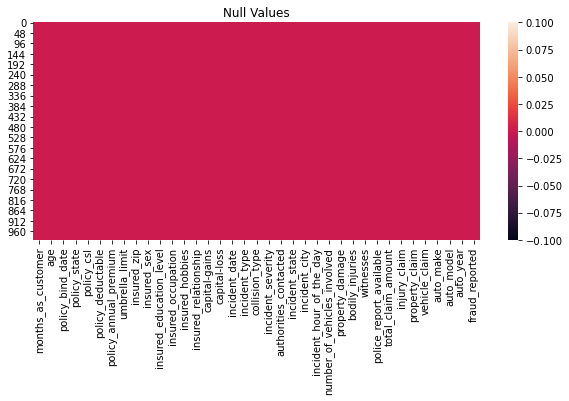

In [12]:
#Visualizeing null values
plt.figure(figsize=[10,4])
sns.heatmap(df.isnull())
plt.title("Null Values")
plt.show()

No null values in the dataset.

In [13]:
#Checking unique values of target column
df['fraud_reported'].unique()

array(['Y', 'N'], dtype=object)

In my target column i have only two unique count which means it's a binary classification problem.

In [14]:
#Checking for empty observations
df.loc[df['fraud_reported'] == " "]

,months_as_customer,age,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported


There is no empty observations in my target column.

In [15]:
#Lets check the value count of each column to see if there are any unexpected and unwanted entries present in the column.
for i in df.columns:
        print(df[i].value_counts())
        print('****************************************')

194    8
285    7
140    7
230    7
128    7
      ..
347    1
113    1
337    1
117    1
0      1
Name: months_as_customer, Length: 391, dtype: int64
****************************************
43    49
39    48
41    45
34    44
30    42
31    42
38    42
37    41
33    39
32    38
40    38
29    35
46    33
35    32
36    32
42    32
44    32
28    30
45    26
26    26
48    25
47    24
27    24
57    16
25    14
49    14
55    14
50    13
53    13
61    10
24    10
54    10
60     9
51     9
58     8
56     8
23     7
21     6
59     5
62     4
52     4
64     2
63     2
22     1
20     1
19     1
Name: age, dtype: int64
****************************************
28-04-1992    3
05-08-1992    3
01-01-2006    3
06-05-2007    2
20-07-1991    2
             ..
21-04-2014    1
23-01-2002    1
01-11-1991    1
04-11-1991    1
02-06-2010    1
Name: policy_bind_date, Length: 951, dtype: int64
****************************************
OH    352
IL    338
IN    310
Name: policy_state, dtype: int64

By looking into the value counts of each column i can say that there is 80% zeros in umbrella_limit, 50% zeros in capital-gains and 47.5% zeros in capital-loss so i have to replace these zeros or else they will create skewness in data.But zeros in capital-gains and capital loss has some meaning so let me keep those zeros as it is but let me drop umbrella_limit column since this column has 80% zeros which is not acceptable.

And i can also notice some '?' in 3 columns
- collision type
- property_damage
- police_report_available

so i have to replace them.

In [16]:
#Droping umbrella_limit column having 80% zeros
df=df.drop(["umbrella_limit"],axis=1)

In [17]:
#checking value count for insured_zip
df[['insured_zip']].value_counts()

insured_zip
456602         2
446895         2
469429         2
477695         2
431202         2
              ..
477268         1
477260         1
476978         1
476737         1
430104         1
Length: 995, dtype: int64

In [18]:
#Since insured zip is a code given to insured person so let me change the dtype to object
df[['insured_zip']] = df[['insured_zip']].astype(object)

Insured zip is a code and it has 995 entries they are just codes given to insured person so this has nothing to do with the model training so let me drop it.

In [19]:
#Droping insured_zip column 
df = df.drop(["insured_zip"],axis=1)

# Feature extraction:

By taking policy_csl column lets extract two other columns.

In [20]:
#Extracting columns from policy_csl
df['csl_per_person'] = df.policy_csl.str.split('/', expand=True)[0]
df['csl_per_accident'] = df.policy_csl.str.split('/', expand=True)[1]

policy_csl was object type data before now i have to convert extracted data from object to int dtype.

In [21]:
#Changing dtype of extracted column
df[['csl_per_person']] = df[['csl_per_person']].astype('int64')
df[['csl_per_accident']] = df[['csl_per_accident']].astype('int64')

In [22]:
#Droping policy_csl column after extraction
df = df.drop(["policy_csl"],axis=1)

In [23]:
#Extracting auto_age from auto year
df['auto_age'] = 2018 - df['auto_year']

In [24]:
#Droping auto_year column after extraction
df = df.drop(["auto_year"],axis=1)

Now i have to extract day,month and yeay from incident_date and policy_bind_date.

In [25]:
#Converting object data type to datetime 
df['policy_bind_date'] =  pd.to_datetime(df['policy_bind_date'])
df['incident_date'] =  pd.to_datetime(df['incident_date'])

In [26]:
#Checking the data types of all columns again
df.dtypes

months_as_customer                      int64
age                                     int64
policy_bind_date               datetime64[ns]
policy_state                           object
policy_deductable                       int64
policy_annual_premium                 float64
insured_sex                            object
insured_education_level                object
insured_occupation                     object
insured_hobbies                        object
insured_relationship                   object
capital-gains                           int64
capital-loss                            int64
incident_date                  datetime64[ns]
incident_type                          object
collision_type                         object
incident_severity                      object
authorities_contacted                  object
incident_state                         object
incident_city                          object
incident_hour_of_the_day                int64
number_of_vehicles_involved       

In [27]:
#Extracting policy_bind year,month and day from policy_bind_date

#Extracting year
df["policy_bind_year"]=pd.to_datetime(df.policy_bind_date, format="%d/%m/%Y").dt.year

#Extracting month
df["policy_bind_month"]=pd.to_datetime(df.policy_bind_date, format="%d/%m/%Y").dt.month

#Extracting day
df["policy_bind_day"]=pd.to_datetime(df.policy_bind_date, format="%d/%m/%Y").dt.day

In [28]:
#Droping policy_bind_date column after extraction
df = df.drop(["policy_bind_date"],axis=1)

In [29]:
#Extracting incident year,month and day from incident_date

#Extracting year
df["incident_year"]=pd.to_datetime(df.incident_date, format="%d/%m/%Y").dt.year

#Extracting month
df["incident_month"]=pd.to_datetime(df.incident_date, format="%d/%m/%Y").dt.month

#Extracting day
df["incident_day"]=pd.to_datetime(df.incident_date, format="%d/%m/%Y").dt.day

In [30]:
#Droping incident_date column after extraction
df = df.drop(["incident_date"],axis=1)

In [31]:
#Checking the dtype now
df.dtypes

months_as_customer               int64
age                              int64
policy_state                    object
policy_deductable                int64
policy_annual_premium          float64
insured_sex                     object
insured_education_level         object
insured_occupation              object
insured_hobbies                 object
insured_relationship            object
capital-gains                    int64
capital-loss                     int64
incident_type                   object
collision_type                  object
incident_severity               object
authorities_contacted           object
incident_state                  object
incident_city                   object
incident_hour_of_the_day         int64
number_of_vehicles_involved      int64
property_damage                 object
bodily_injuries                  int64
witnesses                        int64
police_report_available         object
total_claim_amount               int64
injury_claim             

In [32]:
#Checking the value count agian
for i in df.columns:
        print(df[i].value_counts())
        print('****************************************')

194    8
285    7
140    7
230    7
128    7
      ..
347    1
113    1
337    1
117    1
0      1
Name: months_as_customer, Length: 391, dtype: int64
****************************************
43    49
39    48
41    45
34    44
30    42
31    42
38    42
37    41
33    39
32    38
40    38
29    35
46    33
35    32
36    32
42    32
44    32
28    30
45    26
26    26
48    25
47    24
27    24
57    16
25    14
49    14
55    14
50    13
53    13
61    10
24    10
54    10
60     9
51     9
58     8
56     8
23     7
21     6
59     5
62     4
52     4
64     2
63     2
22     1
20     1
19     1
Name: age, dtype: int64
****************************************
OH    352
IL    338
IN    310
Name: policy_state, dtype: int64
****************************************
1000    351
500     342
2000    307
Name: policy_deductable, dtype: int64
****************************************
1374.22    2
1558.29    2
1389.13    2
1073.83    2
1074.07    2
          ..
1268.79    1
1558.86    1
722.66

incident_year has only one unique value so it does not help for model training so let me drop that column.

In [33]:
#Droping incident_year column after extraction
df = df.drop(["incident_year"],axis=1)

**Now i have to replace all '?' with there mean values.**

In [34]:
#Lets see which columns contains '?'
df[df.columns[(df == '?').any()]].nunique()

collision_type             4
property_damage            3
police_report_available    3
dtype: int64

So all these 3 columns contains '?' so i have to replace them with there mean.

In [35]:
# let's check the mode of collision_type column 
df["collision_type"].mode()  # we will fill the '?' values with this mode value

0    Rear Collision
dtype: object

In [36]:
#Replacing '?' with mode value
df['collision_type'] = df.collision_type.str.replace('?', 'Rear Collision')

In [37]:
#Checking the value counts of property_damage column
df.property_damage.value_counts()

?      360
NO     338
YES    302
Name: property_damage, dtype: int64

So NO is occuring maximum times and NO will be the mode here.I have replace '?' with NO.

In [38]:
#Replacing '?' with mode value
df['property_damage'] = df.property_damage.str.replace('?', 'NO')

In [39]:
#Checking the value counts of police_report_available column
df.police_report_available.value_counts()

?      343
NO     343
YES    314
Name: police_report_available, dtype: int64

So NO is occuring maximum times and NO will be the mode here.I have replace '?' with NO.

In [40]:
#Replacing '?' with mode value
df['police_report_available'] = df.police_report_available.str.replace('?', 'NO')

In [41]:
#lets check dataset after updating
df.head()

,months_as_customer,age,policy_state,policy_deductable,policy_annual_premium,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,fraud_reported,csl_per_person,csl_per_accident,auto_age,policy_bind_year,policy_bind_month,policy_bind_day,incident_month,incident_day
0,328,48,OH,1000,1406.91,MALE,MD,craft-repair,sleeping,husband,53300,0,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,92x,Y,250,500,14,2014,10,17,1,25
1,228,42,IN,2000,1197.22,MALE,MD,machine-op-inspct,reading,other-relative,0,0,Vehicle Theft,Rear Collision,Minor Damage,Police,VA,Riverwood,8,1,NO,0,0,NO,5070,780,780,3510,Mercedes,E400,Y,250,500,11,2006,6,27,1,21
2,134,29,OH,2000,1413.14,FEMALE,PhD,sales,board-games,own-child,35100,0,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,RAM,N,100,300,11,2000,6,9,2,22
3,256,41,IL,2000,1415.74,FEMALE,PhD,armed-forces,board-games,unmarried,48900,-62400,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,5,1,NO,1,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,Y,250,500,4,1990,5,25,10,1
4,228,44,IL,1000,1583.91,MALE,Associate,sales,board-games,unmarried,66000,-46000,Vehicle Theft,Rear Collision,Minor Damage,None,NY,Arlington,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,RSX,N,500,1000,9,2014,6,6,2,17


In [42]:
#Checking shape now
df.shape

(1000, 39)

Now i have 1000 rows and 40 columns.

In [43]:
#Checking description of data set
df.describe()

,months_as_customer,age,policy_deductable,policy_annual_premium,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,csl_per_person,csl_per_accident,auto_age,policy_bind_year,policy_bind_month,policy_bind_day,incident_month,incident_day
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000
mean,203.954000,38.948000,1136.000000,1256.406150,25126.100000,-26793.700000,11.644000,1.83900,0.992000,1.487000,52761.94000,7433.420000,7399.570000,37928.950000,272.650000,580.200000,12.897000,2001.604000,6.559000,15.448000,3.407000,13.08400
std,115.113174,9.140287,611.864673,244.167395,27872.187708,28104.096686,6.951373,1.01888,0.820127,1.111335,26401.53319,4880.951853,4824.726179,18886.252893,161.603196,287.420547,6.015861,7.360391,3.391758,8.850176,3.276291,10.44318
min,0.000000,19.000000,500.000000,433.330000,0.000000,-111100.000000,0.000000,1.00000,0.000000,0.000000,100.00000,0.000000,0.000000,70.000000,100.000000,300.000000,3.000000,1990.000000,1.000000,1.000000,1.000000,1.00000
25%,115.750000,32.000000,500.000000,1089.607500,0.000000,-51500.000000,6.000000,1.00000,0.000000,1.000000,41812.50000,4295.000000,4445.000000,30292.500000,100.000000,300.000000,8.000000,1995.000000,4.000000,8.000000,1.000000,2.00000
50%,199.500000,38.000000,1000.000000,1257.200000,0.000000,-23250.000000,12.000000,1.00000,1.000000,1.000000,58055.00000,6775.000000,6750.000000,42100.000000,250.000000,500.000000,13.000000,2002.000000,7.000000,16.000000,2.000000,15.00000
75%,276.250000,44.000000,2000.000000,1415.695000,51025.000000,0.000000,17.000000,3.00000,2.000000,2.000000,70592.50000,11305.000000,10885.000000,50822.500000,500.000000,1000.000000,18.000000,2008.000000,9.000000,23.000000,5.000000,22.00000
max,479.000000,64.000000,2000.000000,2047.590000,100500.000000,0.000000,23.000000,4.00000,2.000000,3.000000,114920.00000,21450.000000,23670.000000,79560.000000,500.000000,1000.000000,23.000000,2015.000000,12.000000,31.000000,12.000000,31.00000


Describe method will show summary only for numerical columns by default.This will help us to do analysis on outliers/skewness and checking whether null values present in dataset or not by looking into count.By looking into the output i can there are no null values and there are few outliers.

# Visualization:

# Univariate Analysis:

In [44]:
# Separating categorical columns
categorical_columns=[]
for i in df.dtypes.index:
    if df.dtypes[i]=='object':
        categorical_columns.append(i)
print(categorical_columns)

['policy_state', 'insured_sex', 'insured_education_level', 'insured_occupation', 'insured_hobbies', 'insured_relationship', 'incident_type', 'collision_type', 'incident_severity', 'authorities_contacted', 'incident_state', 'incident_city', 'property_damage', 'police_report_available', 'auto_make', 'auto_model', 'fraud_reported']


Above are the list of categorical columns.

In [45]:
# Separating numerical columns
numerical_columns=[]
for i in df.dtypes.index:
    if df.dtypes[i]!='object':
        numerical_columns.append(i)
print(numerical_columns)

['months_as_customer', 'age', 'policy_deductable', 'policy_annual_premium', 'capital-gains', 'capital-loss', 'incident_hour_of_the_day', 'number_of_vehicles_involved', 'bodily_injuries', 'witnesses', 'total_claim_amount', 'injury_claim', 'property_claim', 'vehicle_claim', 'csl_per_person', 'csl_per_accident', 'auto_age', 'policy_bind_year', 'policy_bind_month', 'policy_bind_day', 'incident_month', 'incident_day']


Above are the list of categorical columns.

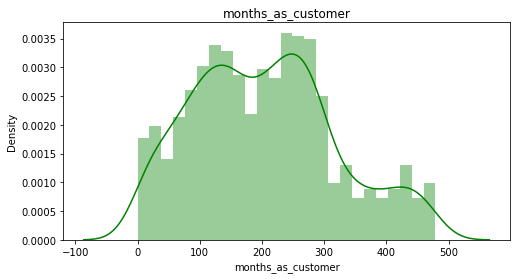

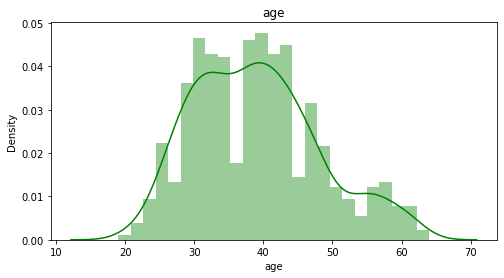

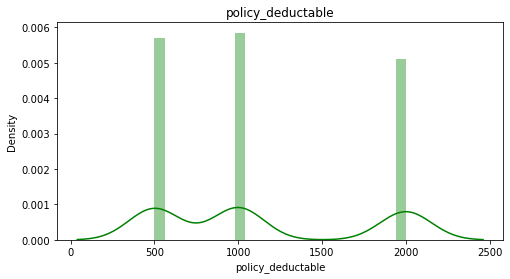

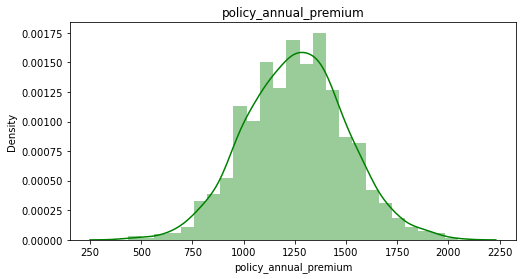

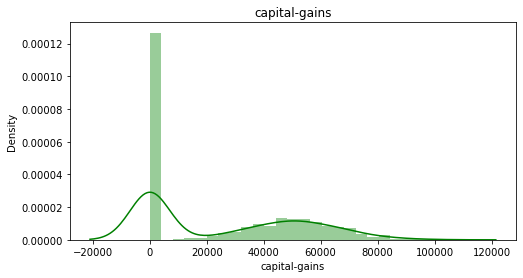

...

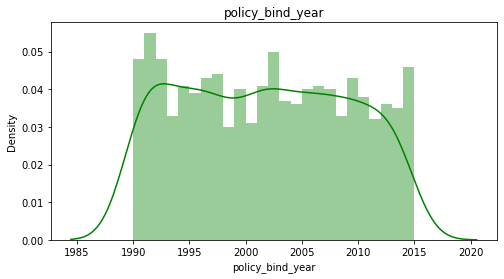

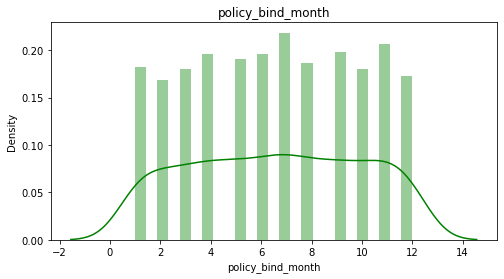

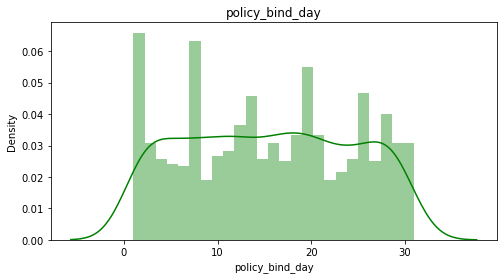

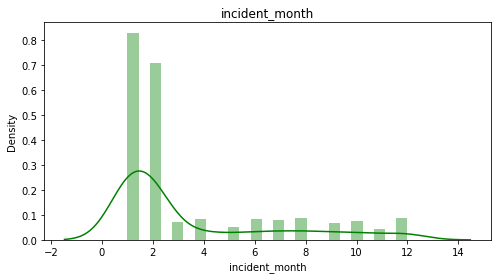

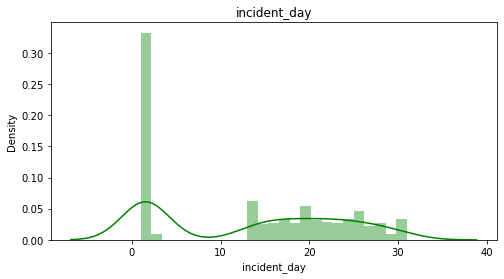

In [46]:
#Distribution plot for all numerical columns
for i in df[numerical_columns]:              
    plt.figure(figsize = (8, 4))
    sns.distplot(df[i], bins = 25, color="g")
    plt.title(i)
    plt.show()

policy_deductable, capital-gains, capital-loss, number_of_vehicles_involved, bodily_injuries, witness, total_claim_amount, injury_claim, property_claim, vehicle_claim, incident_month and incident_day has some skewness so i have to take care of that.

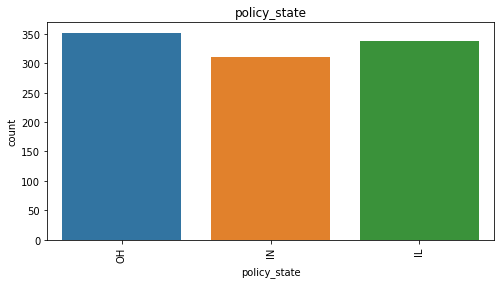

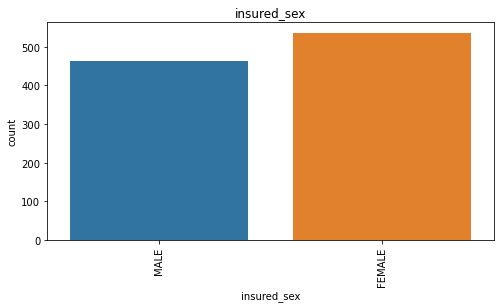

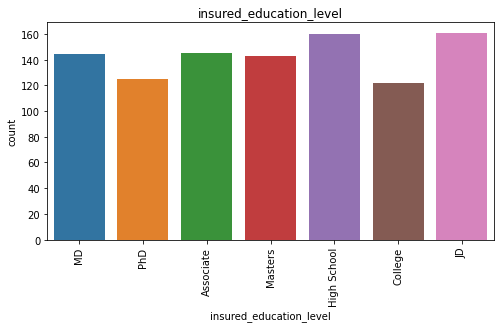

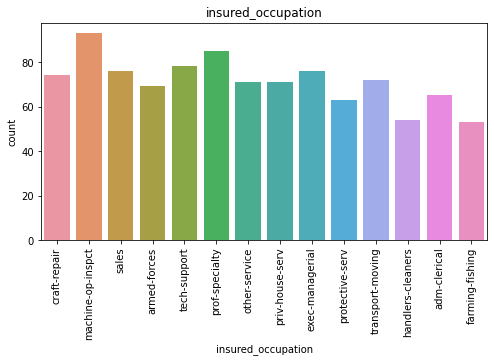

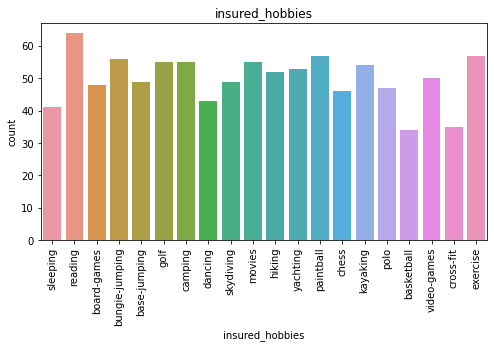

...

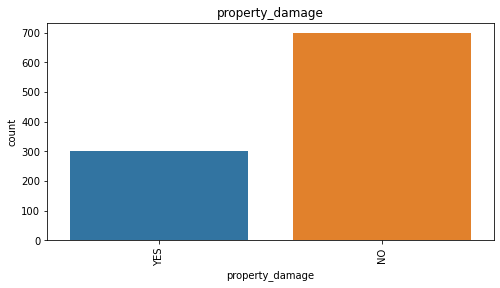

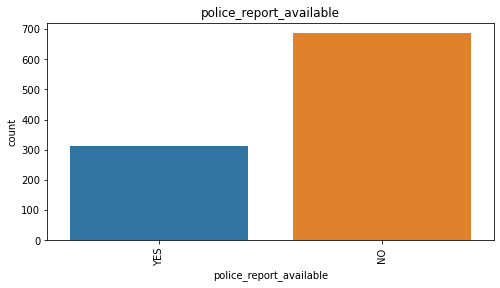

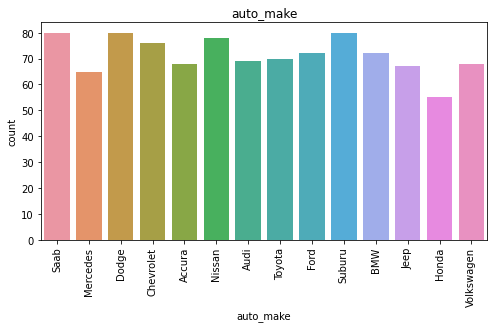

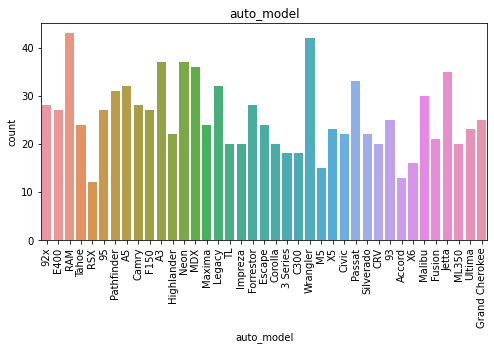

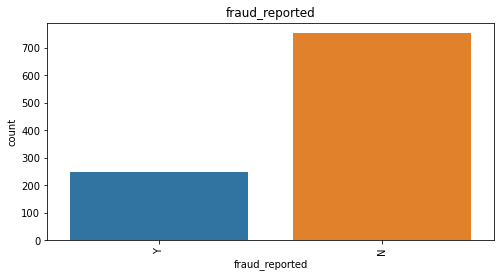

In [47]:
#Distribution plot for all categorical columns
for i in df[categorical_columns]:              
    plt.figure(figsize = (8, 4))
    sns.countplot(df[i])
    plt.title(i)
    plt.xticks(rotation=90)
    plt.show()

By looking into the count plots below are my observations.
- OH policy_state count is high.
- Female insured are more in number.
- JD High school qualified insured are more in number.
- Machine-op-inspct are high in number.
- Most of the insured persons are having reading as there hobbies.
- own-child has maximum count in insured_relationship.
- Multi-vehicle-collision and single-vehicle-collision are more in number.
- Rather than front and side collision Rear Collision has maximum count.
- Minor damage has maximum count compared to Trivial damage.
- Police are the mejority authorities contacted.
- In NY state most of the cases are registered.
- In all the cities the insuered climb are almost same.
- There is very less count for property damage.
- Very less cases have police_report_available.
- Both 250 and 100 have same count in cls_per_person.
- Both 500 and 300 have same count in cls_per_accident.

<AxesSubplot:xlabel='fraud_reported', ylabel='count'>

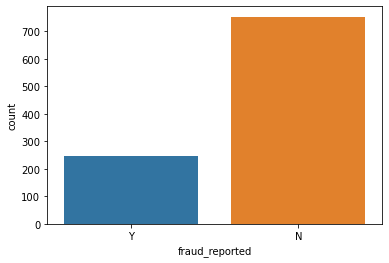

In [48]:
#Count plot for fraud_reported
sns.countplot(df['fraud_reported'])

My target column is imbalanced so i have to take care of this.

# Bivariate Analysis:

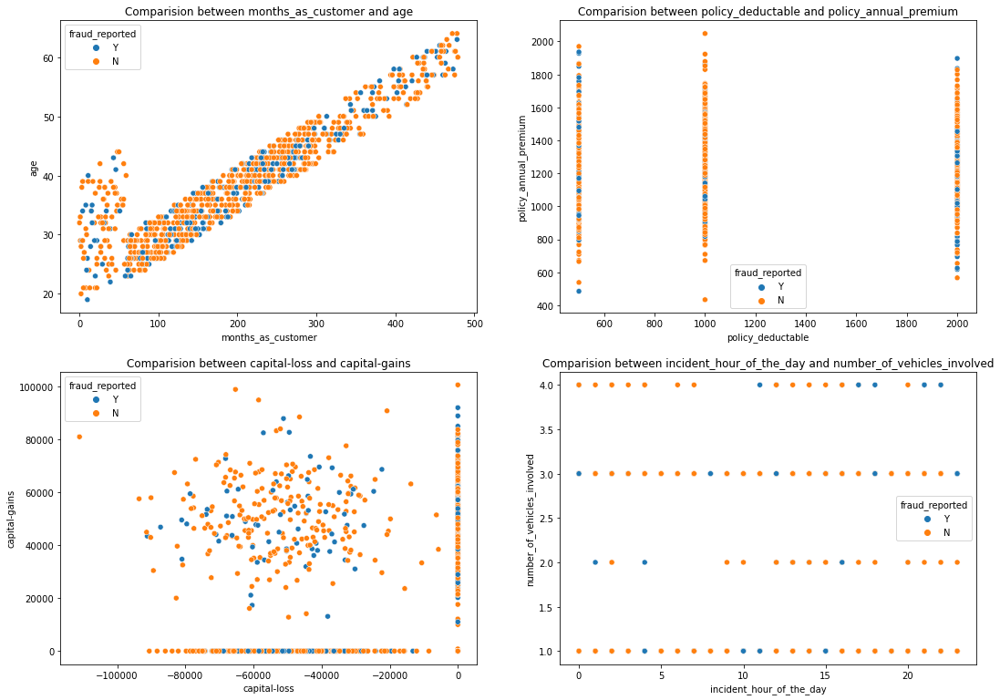

In [49]:
#Comparision between features using scatter plot
plt.figure(figsize=[18,13])

plt.subplot(2,2,1)
plt.title('Comparision between months_as_customer and age')
sns.scatterplot(df['months_as_customer'],df['age'],hue=df['fraud_reported']);

plt.subplot(2,2,2)
plt.title('Comparision between policy_deductable and policy_annual_premium')
sns.scatterplot(df['policy_deductable'],df['policy_annual_premium'],hue=df['fraud_reported']);

plt.subplot(2,2,3)
plt.title('Comparision between capital-loss and capital-gains')
sns.scatterplot(df['capital-loss'],df['capital-gains'],hue=df['fraud_reported']);

plt.subplot(2,2,4)
plt.title('Comparision between incident_hour_of_the_day and number_of_vehicles_involved')
sns.scatterplot(df['incident_hour_of_the_day'],df['number_of_vehicles_involved'],hue=df['fraud_reported']);

- There is a linear increase in 1st graph as the age of the person is more then the months_of_customer is also more.
- In second and 3rd plot i do not see any proper pattern.
- Incident hours has no specific relation with number of vehicles invovled.

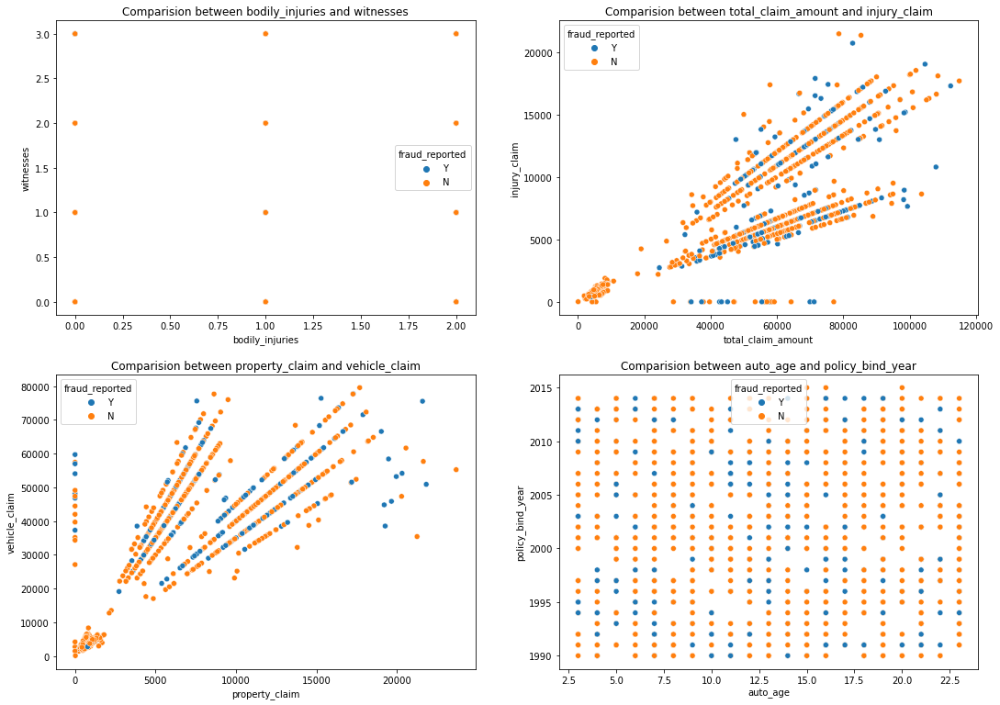

In [50]:
#Comparision between features using scatter plot
plt.figure(figsize=[18,13])

plt.subplot(2,2,1)
plt.title('Comparision between bodily_injuries and witnesses')
sns.scatterplot(df['bodily_injuries'],df['witnesses'],hue=df['fraud_reported']);

plt.subplot(2,2,2)
plt.title('Comparision between total_claim_amount and injury_claim')
sns.scatterplot(df['total_claim_amount'],df['injury_claim'],hue=df['fraud_reported']);

plt.subplot(2,2,3)
plt.title('Comparision between property_claim and vehicle_claim')
sns.scatterplot(df['property_claim'],df['vehicle_claim'],hue=df['fraud_reported']);

plt.subplot(2,2,4)
plt.title('Comparision between auto_age and policy_bind_year')
sns.scatterplot(df['auto_age'],df['policy_bind_year'],hue=df['fraud_reported']);

- In first plot it looks very clear that it does not have any fraud detected.
- In second and 3rd graph it is showing linear increasing plot.i.e., as one feature increses then other feature also increses.
- 4th plot do not show any proper pattern.

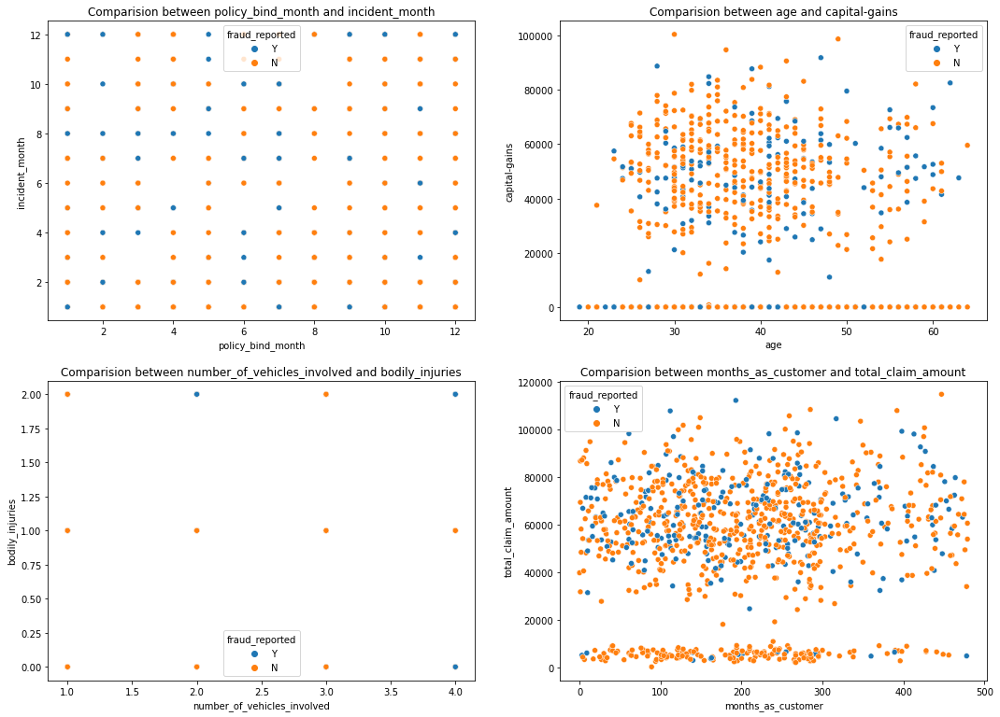

In [51]:
#Comparision between features using scatter plot
plt.figure(figsize=[18,13])

plt.subplot(2,2,1)
plt.title('Comparision between policy_bind_month and incident_month')
sns.scatterplot(df['policy_bind_month'],df['incident_month'],hue=df['fraud_reported']);

plt.subplot(2,2,2)
plt.title('Comparision between age and capital-gains')
sns.scatterplot(df['age'],df['capital-gains'],hue=df['fraud_reported']);

plt.subplot(2,2,3)
plt.title('Comparision between number_of_vehicles_involved and bodily_injuries')
sns.scatterplot(df['number_of_vehicles_involved'],df['bodily_injuries'],hue=df['fraud_reported']);

plt.subplot(2,2,4)
plt.title('Comparision between months_as_customer and total_claim_amount')
sns.scatterplot(df['months_as_customer'],df['total_claim_amount'],hue=df['fraud_reported']);

- 1st graph do not show any proper pattern.
- For the age range of 25-45 the capital-gains is high.
- In 3rd plot i can say there very less number of fraud_detected.
- In 4th plot the points are dence near 0 claim amount and for the range of 50-300 in month_as_customer the total_claim_amount is high.

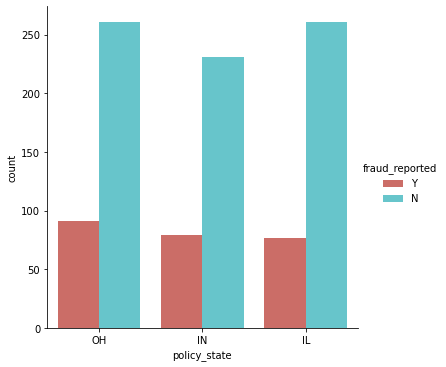

In [52]:
#Factor plot for policy_state
sns.factorplot('policy_state',kind='count',data=df,hue='fraud_reported',palette="hls")
plt.xticks(rotation=0);

In all the policy state fraud_reported is very less.

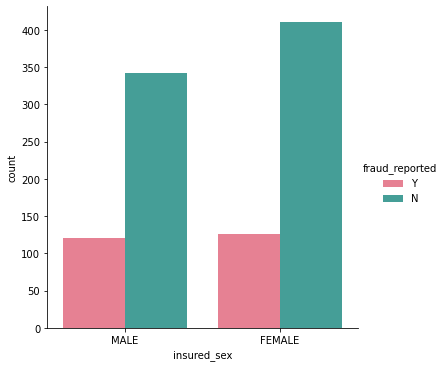

In [53]:
#Factor plot for insured_sex
sns.factorplot('insured_sex',kind='count',data=df,hue='fraud_reported',palette="husl")
plt.xticks(rotation=0);

Fraud detection is less in both insured_sex but fraud not reported is high for females.Which means females are very ethical in climbing insurance.

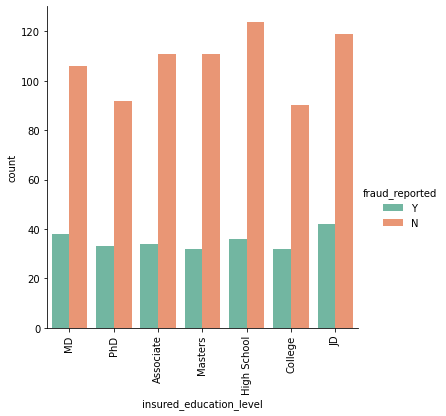

In [54]:
#Factor plot for insured_education_level
sns.factorplot('insured_education_level',kind='count',data=df,hue='fraud_reported',palette="Set2")
plt.xticks(rotation=90);

No fraud is high with customers having highschool education.Which means less educated people are very innocent they don't fraud.

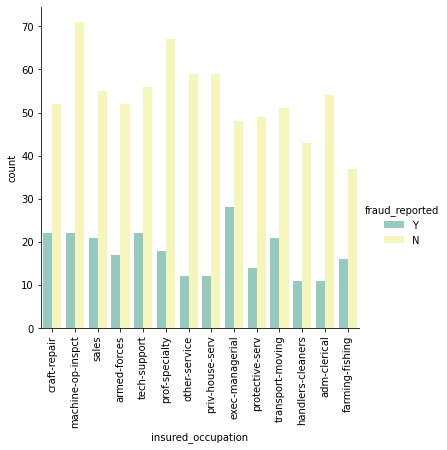

In [55]:
#Factor plot for insured_occupation
sns.factorplot('insured_occupation',kind='count',data=df,hue='fraud_reported',palette="Set3")
plt.xticks(rotation=90);

In all the insured occations the fraud detected is less.

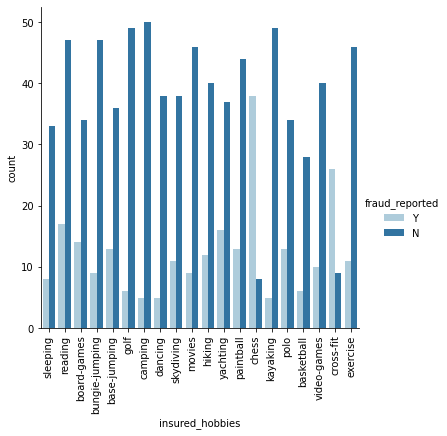

In [56]:
#Factor plot for insured_hobbies
sns.factorplot('insured_hobbies',kind='count',data=df,hue='fraud_reported',palette="Paired")
plt.xticks(rotation=90);

customers with chess and cross-fit has maximum number of fraud predicted.These gaming minded people makes there mind to fraud insurance companines.

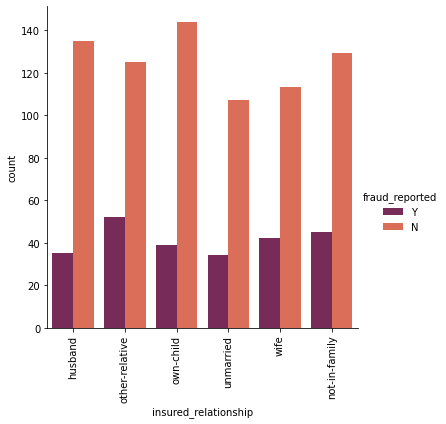

In [57]:
#Factor plot for insured_relationship
sns.factorplot('insured_relationship',kind='count',data=df,hue='fraud_reported',palette="rocket")
plt.xticks(rotation=90);

In unmarried customers the fraud reported is very less.

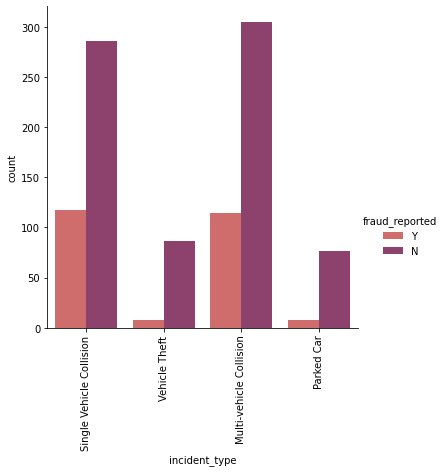

In [58]:
#Factor plot for incident_type
sns.factorplot('incident_type',kind='count',data=df,hue='fraud_reported',palette="flare")
plt.xticks(rotation=90);

In multi vehicle collision and single vehicle collision the fraud detection is high compared to vehicle theft and parked car.

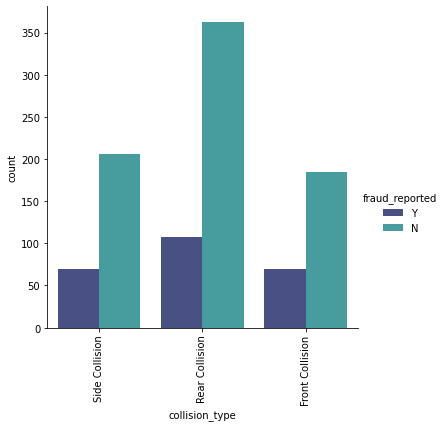

In [59]:
#Factor plot for collision_type
sns.factorplot('collision_type',kind='count',data=df,hue='fraud_reported',palette="mako")
plt.xticks(rotation=90);

In rear collision the fraud detection is more compared to Side collision and Front collision.

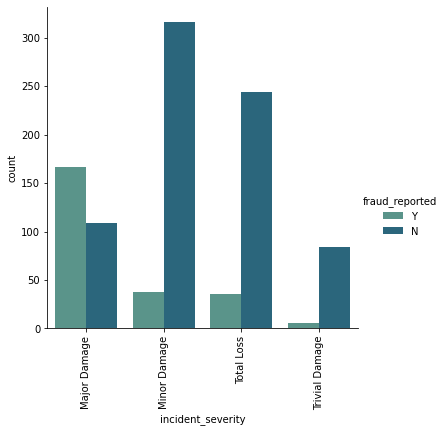

In [60]:
#Factor plot for incident_severity
sns.factorplot('incident_severity',kind='count',data=df,hue='fraud_reported',palette="crest")
plt.xticks(rotation=90);

For major damage type of incident severity the fraud reported is very high. 

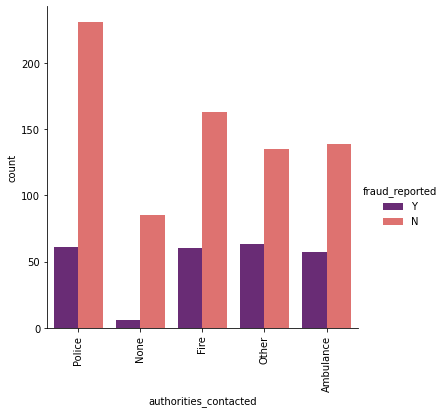

In [61]:
#Factor plot for authorities_contacted
sns.factorplot('authorities_contacted',kind='count',data=df,hue='fraud_reported',palette="magma")
plt.xticks(rotation=90);

Police contacted cases are high and fraud reported is same in all contacts except None.

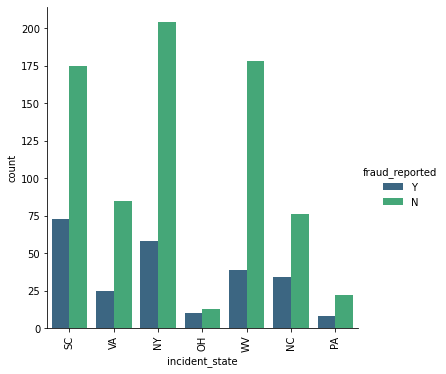

In [62]:
#Factor plot for incident_state
sns.factorplot('incident_state',kind='count',data=df,hue='fraud_reported',palette="viridis")
plt.xticks(rotation=90);

Fraud reported in SC state is high compared to other incident states.

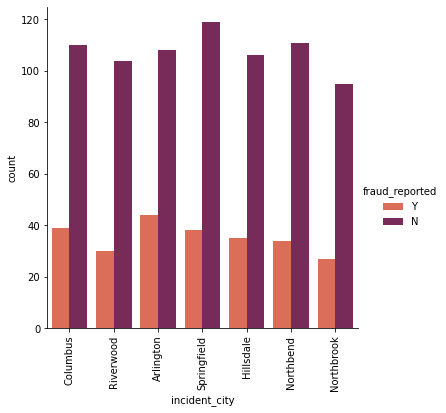

In [63]:
#Factor plot for incident_city
sns.factorplot('incident_city',kind='count',data=df,hue='fraud_reported',palette="rocket_r")
plt.xticks(rotation=90);

In Riverwood and Northbrook the fraud reported is very less compared to other cities.

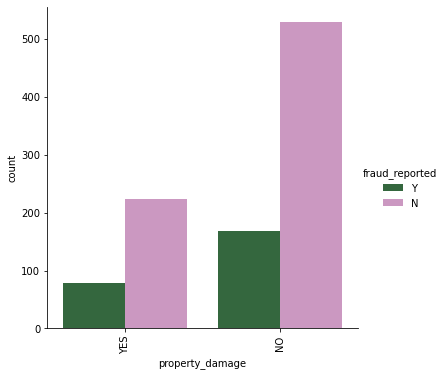

In [64]:
#Factor plot for property_damage
sns.factorplot('property_damage',kind='count',data=df,hue='fraud_reported',palette="cubehelix")
plt.xticks(rotation=90);

In No property damage case the fraud reported is high.

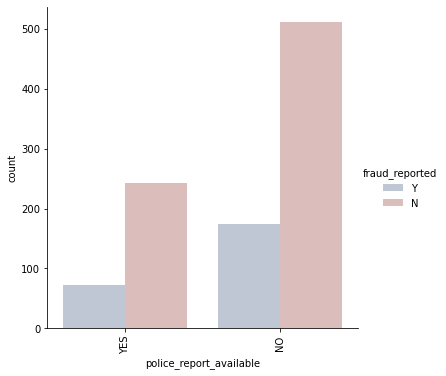

In [65]:
#Factor plot for police_report_available
sns.factorplot('police_report_available',kind='count',data=df,hue='fraud_reported',palette="vlag")
plt.xticks(rotation=90);

If there is no police report available then the fraud rate is high.

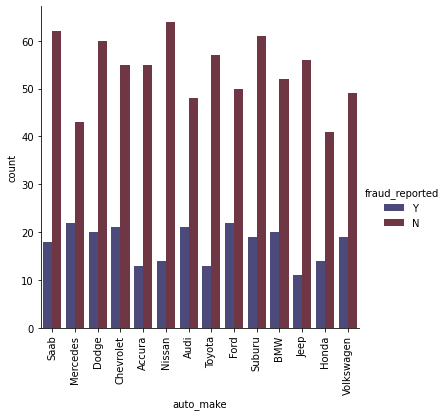

In [66]:
#Factor plot for auto_make
sns.factorplot('auto_make',kind='count',data=df,hue='fraud_reported',palette="icefire")
plt.xticks(rotation=90);

In all auto_make case there are fraud reports.

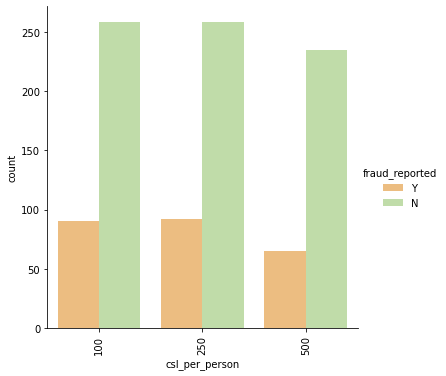

In [67]:
#Factor plot for csl_per_person
sns.factorplot('csl_per_person',kind='count',data=df,hue='fraud_reported',palette="Spectral")
plt.xticks(rotation=90);

with 500 cls_per_person the fraud reported is less.

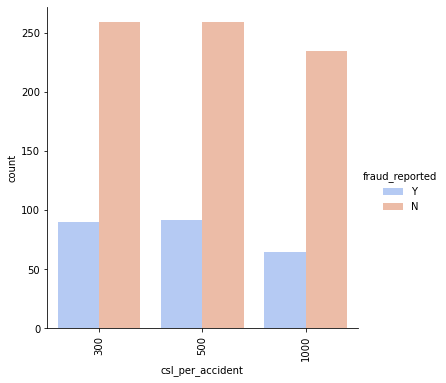

In [68]:
#Factor plot for csl_per_accident
sns.factorplot('csl_per_accident',kind='count',data=df,hue='fraud_reported',palette="coolwarm")
plt.xticks(rotation=90);

For 1000 cls_per_accident the fraud detected are low.

# Multivariate Analysis:

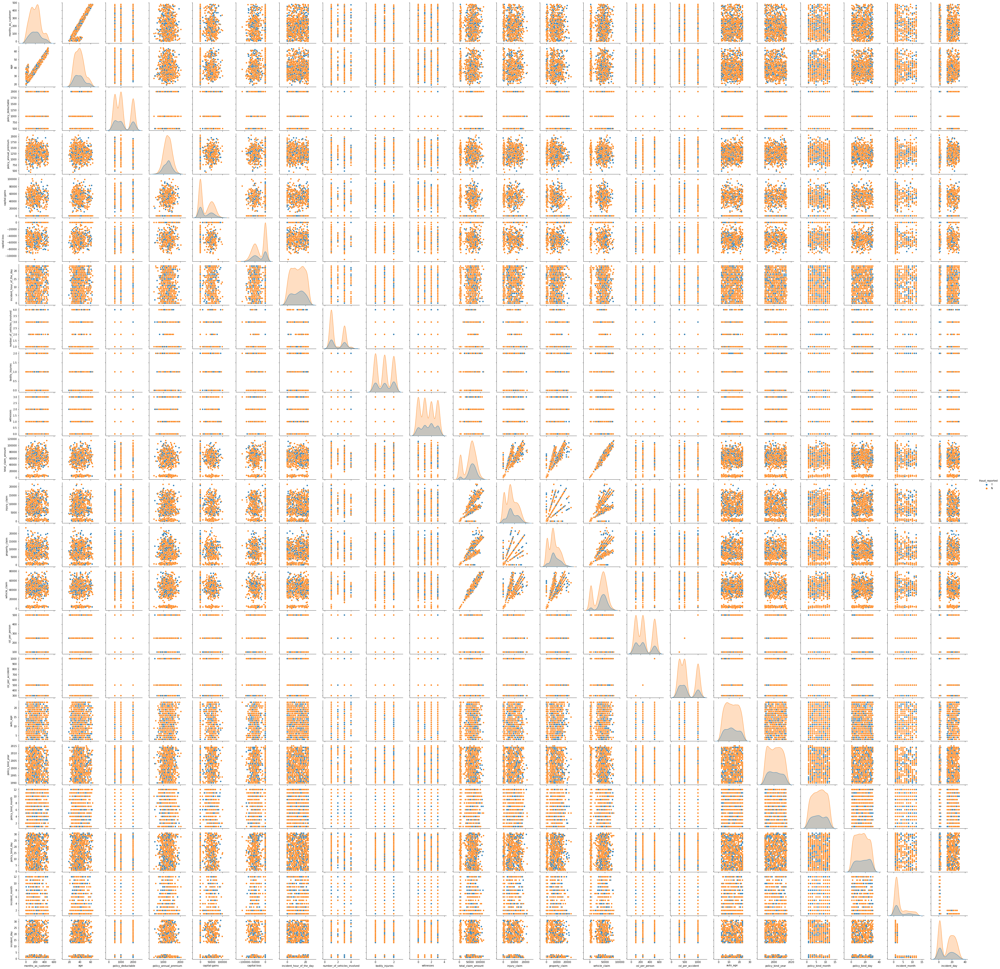

In [69]:
#pair ploting for df
sns.pairplot(df,hue="fraud_reported")

Above is the pair plot for having fraud_reported as target.There are some outliers present in the dataset.I have to take care of them.

# Data Cleaning:

# Checking for outliers:

<AxesSubplot:>

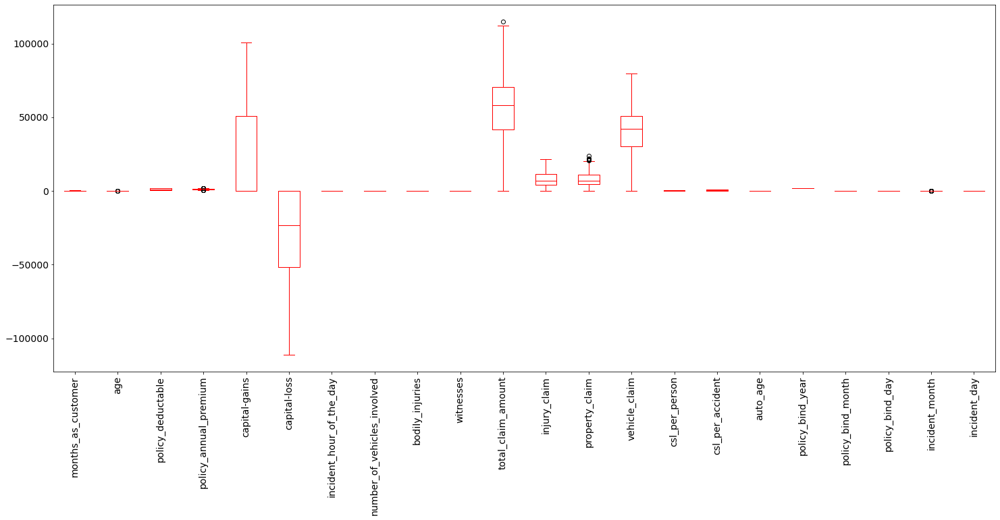

In [70]:
#Checking for outliers using boxplot
df.plot(rot = 90,kind='box',fontsize=14,figsize=(25,10),color='r')

There are outliers in 
- age - (numerical)
- policy_annual_premium - (numerical)
- total_claim_amount - (numerical)
- property_claim - (numerical)
- incident_month - (numerical)

So all the columns with outliers are numerical so i have to remove the outliers in these columns.

# Removing Outliers:

# i) Zscore method:

In [71]:
#Features having outliers
features=df[['age','policy_annual_premium','total_claim_amount','property_claim','incident_month']]

Above are the list of columns with outliers.

In [72]:
from scipy.stats import zscore
z=np.abs(zscore(features))
df_new=df[(z<3).all(axis=1)]
df_new

,months_as_customer,age,policy_state,policy_deductable,policy_annual_premium,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,fraud_reported,csl_per_person,csl_per_accident,auto_age,policy_bind_year,policy_bind_month,policy_bind_day,incident_month,incident_day
0,328,48,OH,1000,1406.91,MALE,MD,craft-repair,sleeping,husband,53300,0,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,92x,Y,250,500,14,2014,10,17,1,25
1,228,42,IN,2000,1197.22,MALE,MD,machine-op-inspct,reading,other-relative,0,0,Vehicle Theft,Rear Collision,Minor Damage,Police,VA,Riverwood,8,1,NO,0,0,NO,5070,780,780,3510,Mercedes,E400,Y,250,500,11,2006,6,27,1,21
2,134,29,OH,2000,1413.14,FEMALE,PhD,sales,board-games,own-child,35100,0,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,RAM,N,100,300,11,2000,6,9,2,22
3,256,41,IL,2000,1415.74,FEMALE,PhD,armed-forces,board-games,unmarried,48900,-62400,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,5,1,NO,1,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,Y,250,500,4,1990,5,25,10,1
4,228,44,IL,1000,1583.91,MALE,Associate,sales,board-games,unmarried,66000,-46000,Vehicle Theft,Rear Collision,Minor Damage,None,NY,Arlington,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,RSX,N,500,1000,9,2014,6,6,2,17
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,OH,1000,1310.80,FEMALE,Masters,craft-repair,paintball,unmarried,0,0,Single Vehicle Collision,Front Collision,Minor Damage,Fire,NC,Northbrook,20,1,YES,0,1,NO,87200,17440,8720,61040,Honda,Accord,N,500,1000,12,1991,7,16,2,22
996,285,41,IL,1000,1436.79,FEMALE,PhD,prof-specialty,sleeping,wife,70900,0,Single Vehicle Collision,Rear Collision,Major Damage,Fire,SC,Northbend,23,1,YES,2,3,NO,108480,18080,18080,72320,Volkswagen,Passat,N,100,300,3,2014,5,1,1,24
997,130,34,OH,500,1383.49,FEMALE,Masters,armed-forces,bungie-jumping,other-relative,35100,0,Multi-vehicle Collision,Side Collision,Minor Damage,Police,NC,Arlington,4,3,NO,2,3,YES,67500,7500,7500,52500,Suburu,Impreza,N,250,500,22,2003,2,17,1,23
998,458,62,IL,2000,1356.92,MALE,Associate,handlers-cleaners,base-jumping,wife,0,0,Single Vehicle Collision,Rear Collision,Major Damage,Other,NY,Arlington,2,1,NO,0,1,YES,46980,5220,5220,36540,Audi,A5,N,500,1000,20,2011,11,18,2,26


I have removed the skewness using zscore method.



In [73]:
#Checking shape of new dataset
df_new.shape

(996, 39)

In my new dataset i have 996 rows and 39 columns.

In [74]:
#Checking shape of old dataset
df.shape

(1000, 39)

In my old dataset i was having 1000 rows and 39 columns.

In [75]:
#Checking dataloss in zscore method
Dataloss = (((1000-996)/1000)*100)
Dataloss

0.4

Using Zscore i have 0.4% data loss.Which is less than 10%.But still let me have a look into IQR method also.

# ii) IQR method:

In [76]:
# 1st quantile
Q1=features.quantile(0.25)

# 3rd quantile
Q3=features.quantile(0.75)

# IQR
IQR=Q3 - Q1

df_1=df[~((df < (Q1 - 1.5 * IQR)) |(df > (Q3 + 1.5 * IQR))).any(axis=1)]

I have removed the skewness using IQR method.

In [77]:
#Checking shape of new dataset
df_1.shape

(942, 39)

In my new dataset i have 942 rows and 39 columns.

In [78]:
#Checking shape of old dataset
df.shape

(1000, 39)

In my old dataset i was having 1000 rows and 39 columns.

In [79]:
#Checking dataloss in IQR
Dataloss = (((1000-942)/1000)*100)
Dataloss

5.800000000000001

In IQR method also the dataloss is less than 10% but compared to zscore IQR is more so let me stck on to zscore method to remove outliers.

# Checking for skewness:

In [80]:
#Checking for skewness
df_new.skew()

months_as_customer             0.359605
age                            0.474526
policy_deductable              0.473229
policy_annual_premium          0.032042
capital-gains                  0.478850
capital-loss                  -0.393015
incident_hour_of_the_day      -0.039123
number_of_vehicles_involved    0.500364
bodily_injuries                0.011117
witnesses                      0.025758
total_claim_amount            -0.593473
injury_claim                   0.267970
property_claim                 0.357130
vehicle_claim                 -0.619755
csl_per_person                 0.413713
csl_per_accident               0.609316
auto_age                       0.049276
policy_bind_year               0.058499
policy_bind_month             -0.029722
policy_bind_day                0.028923
incident_month                 1.377097
incident_day                   0.055659
dtype: float64

There is skewness in 
- total_claim_amount
- vehicle_claim
- csl_per_accident
- incident_month

# Removing skewness using yeo-johnson method:

In [81]:
#Creating a list of skewed features
fea=["total_claim_amount","vehicle_claim","csl_per_accident","incident_month"]

Taking a list as fea with all the columns with skewness.

In [82]:
from sklearn.preprocessing import PowerTransformer
scaler = PowerTransformer(method='yeo-johnson')
'''
parameters:
method = 'box_cox' or 'yeo-johnson'
'''

"\nparameters:\nmethod = 'box_cox' or 'yeo-johnson'\n"

Using yeo_johnson method i am removing the skewness.

In [83]:
df_new[fea] = scaler.fit_transform(df_new[fea].values)

Got removed from skewness.

In [84]:
#Checking skewness again
df_new[fea].skew()

total_claim_amount   -0.508953
vehicle_claim        -0.521354
csl_per_accident      0.110964
incident_month        0.305741
dtype: float64

Skewness in all columns is reduced.

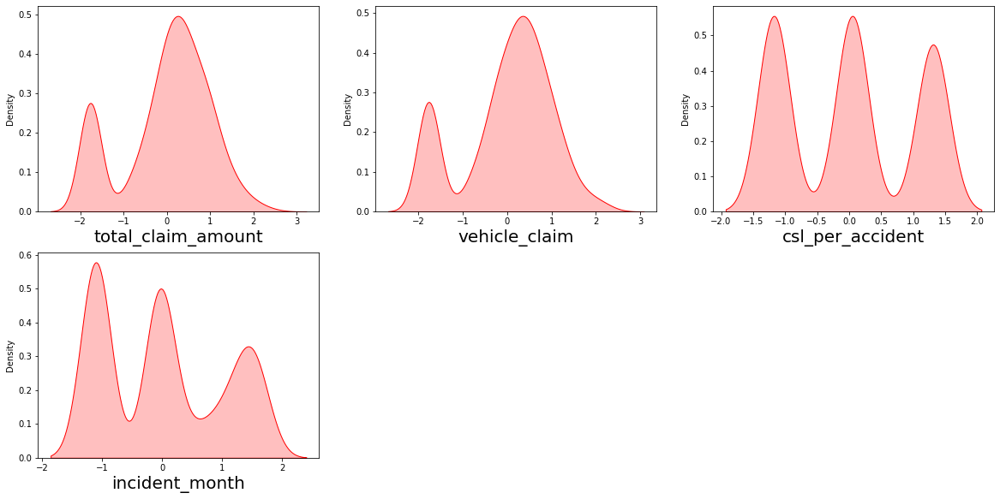

In [85]:
# After removing let's check how the data has been distributed in each column.

plt.figure(figsize=(20,15), facecolor='white')
plotnumber = 1

for column in df_new[fea]:
    if plotnumber<=9:
        ax = plt.subplot(3,3,plotnumber)
        sns.distplot(df_new[column],color='r',kde_kws={"shade": True},hist=False)
        plt.xlabel(column,fontsize=20)
    plotnumber+=1
plt.show()

# Label Encoding:

In [86]:
# Separating categorical columns in df_new
cat_col=[]
for i in df_new.dtypes.index:
    if df_new.dtypes[i]=='object':
        cat_col.append(i)
print(cat_col)

['policy_state', 'insured_sex', 'insured_education_level', 'insured_occupation', 'insured_hobbies', 'insured_relationship', 'incident_type', 'collision_type', 'incident_severity', 'authorities_contacted', 'incident_state', 'incident_city', 'property_damage', 'police_report_available', 'auto_make', 'auto_model', 'fraud_reported']


Above are the list of categorical columns in new dataset.

In [87]:
from sklearn.preprocessing import LabelEncoder
LE=LabelEncoder()
df_new[cat_col]= df_new[cat_col].apply(LE.fit_transform)

In [88]:
df_new[cat_col].head()

,policy_state,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,property_damage,police_report_available,auto_make,auto_model,fraud_reported
0,2,1,4,2,17,0,2,2,0,4,4,1,1,1,10,1,1
1,1,1,4,6,15,2,3,1,1,4,5,5,0,0,8,12,1
2,2,0,6,11,2,3,0,1,1,4,1,1,0,0,4,30,0
3,0,0,6,1,2,4,2,0,0,4,2,0,0,0,3,34,1
4,0,1,0,11,2,4,3,1,1,2,1,0,0,0,0,31,0


Using label encoder i have encoded the categorical columns.

# Checking correlation using heat map:

In [89]:
cor=df_new.corr()

Checking correlation.

In [90]:
cor

,months_as_customer,age,policy_state,policy_deductable,policy_annual_premium,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,fraud_reported,csl_per_person,csl_per_accident,auto_age,policy_bind_year,policy_bind_month,policy_bind_day,incident_month,incident_day
months_as_customer,1.000000,0.922092,0.000118,0.023512,-0.003378,0.059002,-0.000848,0.005365,-0.092575,0.071097,0.007601,0.020771,-0.017202,-0.072479,-0.061932,0.011406,0.006906,-0.001837,0.068962,0.013609,0.002663,-0.011126,0.063530,-0.018760,0.064662,0.066416,0.041157,0.062392,0.049222,0.002908,0.020966,-0.022063,-0.022928,-0.001287,-0.046010,0.004955,0.054175,0.019029,-0.013502
age,0.922092,1.000000,-0.015182,0.026772,0.005890,0.072900,0.001485,0.014030,-0.080587,0.075940,-0.006333,0.008192,-0.025979,-0.075892,-0.060361,0.016000,0.007053,-0.004009,0.085509,0.021140,-0.005795,-0.017461,0.056658,-0.018493,0.070582,0.075480,0.064230,0.062165,0.032105,0.016258,0.012408,-0.012844,-0.012459,-0.003268,-0.035505,0.015874,0.054465,0.016685,-0.008174
policy_state,0.000118,-0.015182,1.000000,0.010740,0.014475,-0.019294,-0.032551,-0.031016,-0.040215,-0.018855,0.072552,-0.032268,0.031769,0.050953,-0.026728,-0.017738,0.009195,-0.004475,0.026464,-0.043447,-0.009334,0.008992,0.024809,0.065957,-0.008788,-0.046398,0.002678,-0.000472,0.015848,-0.024513,0.028864,-0.005866,-0.000653,-0.002323,-0.005709,0.071527,0.001030,0.026233,0.013370
policy_deductable,0.023512,0.026772,0.010740,1.000000,-0.008445,-0.011671,0.014571,-0.050024,0.005134,-0.021763,0.035950,-0.024018,-0.038696,-0.054153,-0.017352,-0.000210,0.007419,-0.046560,0.059733,0.051317,0.014131,-0.023384,0.069433,0.040969,0.025169,0.040337,0.069537,0.005902,-0.034266,-0.003597,0.015833,0.006634,0.006179,-0.027497,-0.048465,-0.051368,0.011204,-0.000169,-0.018867
policy_annual_premium,-0.003378,0.005890,0.014475,-0.008445,1.000000,0.041830,-0.021475,0.030963,-0.014376,0.006474,-0.009757,0.029835,0.049336,0.034999,-0.015788,-0.058852,0.049047,0.047389,-0.003001,-0.044711,0.078922,0.025323,0.006365,0.029619,0.002905,-0.024031,-0.007964,0.012961,0.011595,-0.034998,-0.010174,0.028569,0.030755,0.040439,0.001650,-0.028452,-0.030886,-0.012386,0.016400
insured_sex,0.059002,0.072900,-0.019294,-0.011671,0.041830,1.000000,0.007473,-0.009257,-0.019600,0.004104,-0.020651,-0.024440,0.010572,-0.014399,-0.029576,0.019000,-0.021822,0.013251,0.017950,0.019275,0.025911,-0.020201,0.044173,0.009884,-0.020117,0.004603,-0.009457,-0.026816,0.026040,-0.017679,0.032173,-0.019001,-0.008959,0.028638,-0.031981,-0.007259,0.045694,0.024223,-0.007249
insured_education_level,-0.000848,0.001485,-0.032551,0.014571,-0.021475,0.007473,1.000000,-0.021502,0.022806,-0.021595,0.040283,0.039890,0.012385,-0.020687,-0.007395,-0.011831,-0.006118,-0.019160,-0.057232,-0.001308,-0.048624,-0.011455,0.017577,0.054380,0.076528,0.083672,0.058663,0.070001,0.057528,0.050878,0.011520,0.011093,0.010425,-0.045094,0.017801,-0.007489,0.014464,0.069312,-0.055411
insured_occupation,0.005365,0.014030,-0.031016,-0.050024,0.030963,-0.009257,-0.021502,1.000000,-0.009818,-0.008141,-0.007553,-0.021993,0.003427,0.006634,0.002255,-0.007367,-0.021531,-0.002158,-0.021308,-0.015177,-0.018839,-0.001830,-0.011373,-0.021730,0.006458,0.022693,0.008301,0.000954,0.044321,0.020878,0.003335,0.018978,0.019575,0.004827,-0.025282,0.024516,-0.003030,0.013226,-0.022786
insured_hobbies,-0.092575,-0.080587,-0.040215,0.005134,-0.014376,-0.019600,0.022806,-0.009818,1.000000,-0.097837,0.053503,-0.032345,0.008256,0.016756,-0.023999,-0.028153,0.085633,0.018605,0.019802,0.011927,0.036599,0.030730,-0.034308,-0.030149,-0.003759,0.028415,0.009925,-0.015968,-0.000055,

Above are the correlations of all the pair of features.To get better visualization on the correlation of features,let me plot it using heat map.

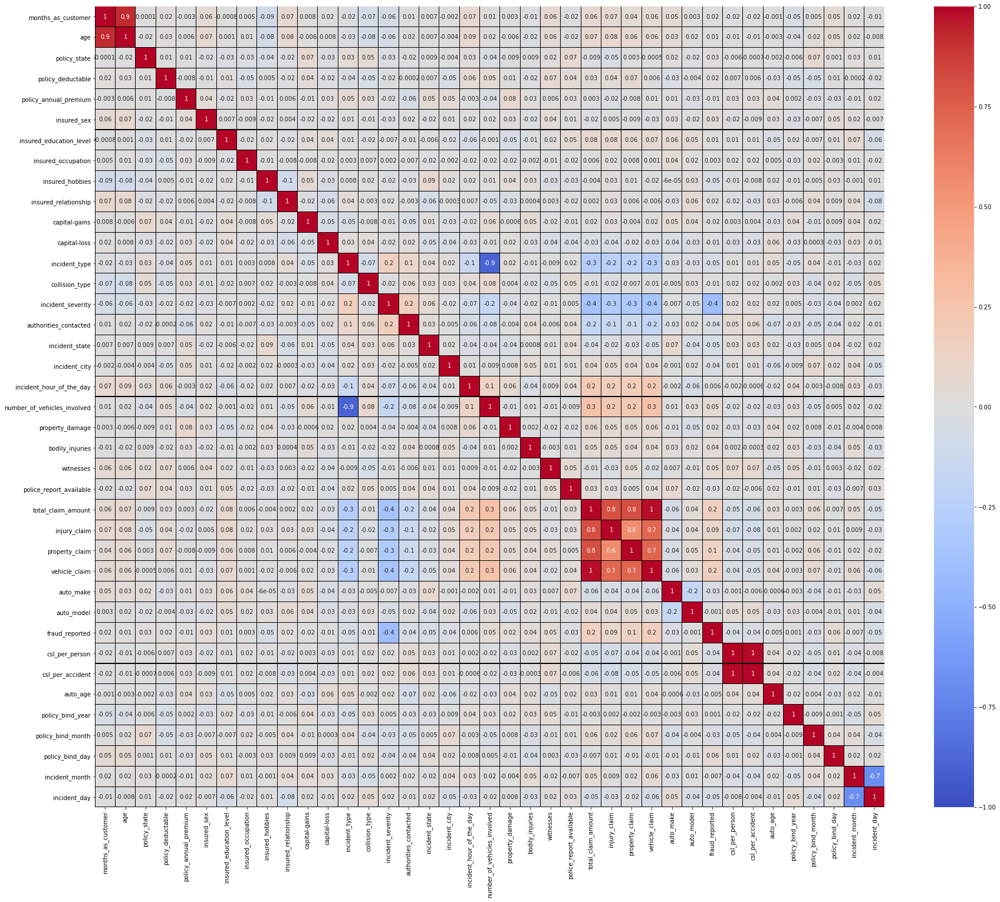

In [91]:
# Visualizing the correlation matrix by plotting heat map.
plt.figure(figsize=(30,25))
sns.heatmap(df_new.corr(),linewidths=.1,vmin=-1, vmax=1, fmt='.1g', annot = True, linecolor="black",annot_kws={'size':10},cmap="coolwarm")
plt.yticks(rotation=0);

- I can notice a multicolinearity issue between incident type and number_of_vehicles_invovled.
- There is multicolinearity issue between incident_month and incident_day.
- There is multicolinearity issue between total_claim_amount and injury_claim.
- There is multicolinearity issue between total_claim_amount and property_claim.
- There is multicolinearity issue between injury_claim and vehicle_claim.
- There is multicolinearity issue between total_claim_amount and vehicle_claim.
- There is multicolinearity issue between vehicle_claim and property_claim.
- There is multicolinearity issue between total_claim_amount and property_claim.

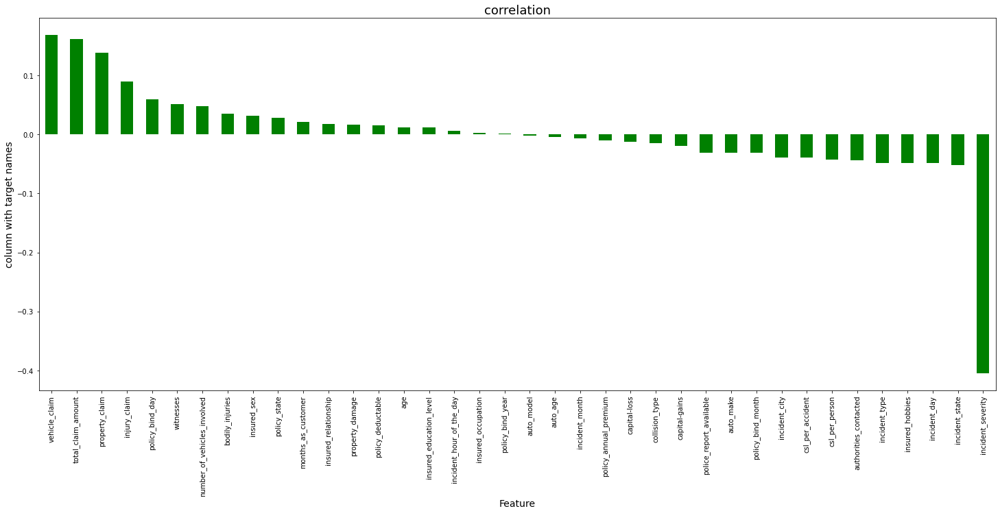

In [92]:
plt.figure(figsize=(25,10))
df_new.corr()['fraud_reported'].sort_values(ascending=False).drop(['fraud_reported']).plot(kind='bar',color='g')
plt.xlabel('Feature',fontsize=14)
plt.ylabel('column with target names',fontsize=14)
plt.title('correlation',fontsize=18)
plt.show()

- policy_bind_year is least correlated with target variable.
- insured_occupation and auto_model are less correlated with target column.
- auto_age and incident_hour_of_the_day also less correlated with target

# Separating features and label:

In [93]:
x = df_new.drop("fraud_reported",axis=1)
y = df_new["fraud_reported"]

I have separated my target and independent columns.

# Scaling the data using standard scaler:

In [94]:
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
X = pd.DataFrame(scaler.fit_transform(x), columns=x.columns)

I have scaled my data using standard scaler.

In [95]:
X.head()

,months_as_customer,age,policy_state,policy_deductable,policy_annual_premium,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,csl_per_person,csl_per_accident,auto_age,policy_bind_year,policy_bind_month,policy_bind_day,incident_month,incident_day
0,1.074671,0.987190,1.186130,-0.224722,0.621371,1.075102,0.531088,-1.162296,1.280299,-1.436113,1.010158,0.953763,0.765670,1.343731,-1.261019,1.196829,0.352556,-0.964353,-0.959495,-0.824928,1.515920,0.007356,0.466826,1.480644,0.717556,-0.188161,1.174449,0.754553,0.857248,-1.644810,-0.137684,0.052612,0.182338,1.686176,1.013751,0.177487,-1.101370,1.139807
1,0.204846,0.330455,-0.018137,1.409024,-0.251375,1.075102,0.531088,-0.166257,0.928186,-0.246617,-0.900970,0.953763,1.690043,-0.030351,-0.197535,1.196829,0.815808,0.992846,-0.527592,-0.824928,-0.659665,-1.213749,-1.335340,-0.675382,-1.777785,-1.363038,-1.376935,-1.787353,0.360986,-0.657437,-0.137684,0.052612,-0.316587,0.599693,-0.166145,1.309223,-1.101370,0.756374
2,-0.612790,-1.092470,1.186130,1.409024,0.647301,-0.930144,1.557206,1.078792,-1.360550,0.348131,0.357578,0.953763,-1.083075,-0.030351,-0.197535,1.196829,-1.037202,-0.964353,-0.671560,1.138341,-0.659665,1.228462,1.367910,-0.675382,-0.716483,0.055836,-0.737005,-0.820820,-0.631538,0.958263,-1.066352,-1.174021,-0.316587,-0.215170,-0.166145,-0.727901,-0.026479,0.852233
3,0.448397,0.221000,-1.222403,1.409024,0.658123,-0.930144,1.557206,-1.411305,-1.360550,0.942878,0.852392,-1.269246,0.765670,-1.404433,-1.261019,1.196829,-0.573950,-1.453652,-0.959495,-0.824928,-0.659665,0.007356,0.466826,-0.675382,0.392931,-0.223018,-0.217973,0.678427,-0.879669,1.317308,-0.137684,0.052612,-1.480744,-1.573274,-0.461119,1.082875,1.553647,-1.160788
4,0.204846,0.549367,-1.222403,-0.224722,1.358059,1.075102,-1.521148,1.078792,-1.360550,0.942878,1.465530,-0.684994,1.690043,-0.030351,-0.197535,-0.108088,-1.037202,-1.453652,1.200020,-0.824928,-0.659665,-1.213749,-0.434257,-0.675382,-1.730555,-1.256417,-1.404033,-1.740710,-1.624063,1.048024,1.410096,1.313327,-0.649203,1.686176,-0.166145,-1.067422,-0.026479,0.372942


This is the data of independent variables after scaling.



# Checking multicolinearity using VIF:

In [96]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif=pd.DataFrame()
vif["vif_Features"]=[variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif["Features"]=X.columns
vif

,vif_Features,Features
0,6.851319,months_as_customer
1,6.855557,age
2,1.039410,policy_state
3,1.045656,policy_deductable
4,1.037450,policy_annual_premium
5,1.037410,insured_sex
6,1.047043,insured_education_level
7,1.017493,insured_occupation
8,1.052669,insured_hobbies
9,1.052965,insured_relationship


In [97]:
#Droping high VIF columns
X = X.drop(["total_claim_amount"],axis=1)

In [98]:
vif=pd.DataFrame()
vif["vif_Features"]=[variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif["Features"]=X.columns
vif

,vif_Features,Features
0,6.849523,months_as_customer
1,6.855452,age
2,1.039378,policy_state
3,1.044129,policy_deductable
4,1.036722,policy_annual_premium
5,1.034404,insured_sex
6,1.046991,insured_education_level
7,1.016776,insured_occupation
8,1.050855,insured_hobbies
9,1.052941,insured_relationship


In [99]:
#Droping high VIF columns
X = X.drop(["csl_per_accident"],axis=1)

In [100]:
vif=pd.DataFrame()
vif["vif_Features"]=[variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
vif["Features"]=X.columns
vif

,vif_Features,Features
0,6.847077,months_as_customer
1,6.852905,age
2,1.038072,policy_state
3,1.043977,policy_deductable
4,1.036330,policy_annual_premium
5,1.029258,insured_sex
6,1.046990,insured_education_level
7,1.016674,insured_occupation
8,1.049392,insured_hobbies
9,1.048658,insured_relationship


Now the multicolinearity issue is solved.All the VIF values are below 10 it is acceptable.

# Balancing the target variable using oversampling:

In [101]:
#Checking the value count of target column
y.value_counts()

0    750
1    246
Name: fraud_reported, dtype: int64

In [102]:
from imblearn.over_sampling import SMOTE
SM = SMOTE()
X, y = SM.fit_resample(X,y)

In [103]:
# Checking the value counts again
y.value_counts()

1    750
0    750
Name: fraud_reported, dtype: int64

<AxesSubplot:xlabel='fraud_reported', ylabel='count'>

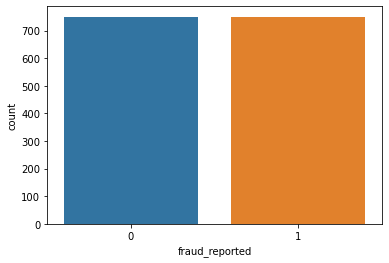

In [104]:
# Visualizing the target data after oversampling
sns.countplot(y)

Now the data looks beautifully balanced.

# Finding Best Random State and Accuracy:

In [105]:
#importing necessary libraries
from sklearn.metrics import accuracy_score
from sklearn.metrics import r2_score
from sklearn.model_selection import train_test_split

In [106]:
from sklearn.ensemble import ExtraTreesClassifier
maxAccu=0
maxRS=0
for i in range(1,200):
    X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=.30, random_state =i)
    mod = ExtraTreesClassifier()
    mod.fit(X_train, y_train)
    pred = mod.predict(X_test)
    acc=accuracy_score(y_test, pred)
    if acc>maxAccu:
        maxAccu=acc
        maxRS=i
print("Best accuracy is ",maxAccu," on Random_state ",maxRS)

Best accuracy is  0.94  on Random_state  80


Got the best accuracy and random state.

In [107]:
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=.30,random_state=maxRS)

Created train and test data.

# Classification Algorithms:

In [108]:
#importing necessary libraries.
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import BernoulliNB
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.linear_model import LogisticRegression
from xgboost import XGBClassifier
from sklearn.metrics import classification_report
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.neighbors import KNeighborsClassifier as KNN
from sklearn.naive_bayes import GaussianNB as NB
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, roc_auc_score, accuracy_score

# i) RandomForestClassifier:

In [109]:
RFC=RandomForestClassifier()
RFC.fit(X_train,y_train)
predrf=RFC.predict(X_test)
print('Accuracy Score:',accuracy_score(y_test, predrf))
print('Confusion Matrix:',confusion_matrix(y_test, predrf))
print(classification_report(y_test,predrf))

Accuracy Score: 0.9177777777777778
Confusion Matrix: [[206  17]
 [ 20 207]]
              precision    recall  f1-score   support

           0       0.91      0.92      0.92       223
           1       0.92      0.91      0.92       227

    accuracy                           0.92       450
   macro avg       0.92      0.92      0.92       450
weighted avg       0.92      0.92      0.92       450



RFC is giving me 91% accuracy.

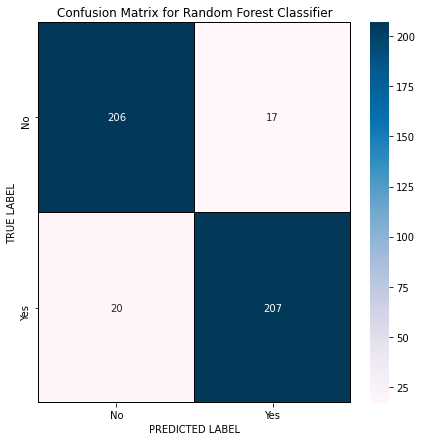

In [110]:
cm = confusion_matrix(y_test, predrf)

x_axis_labels = ["No","Yes"]
y_axis_labels = ["No","Yes"]

f, ax = plt.subplots(figsize =(7,7))
sns.heatmap(cm, annot = True, linewidths=0.2, linecolor="black", fmt = ".0f", ax=ax, cmap="PuBu", xticklabels=x_axis_labels, yticklabels=y_axis_labels)
plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for Random Forest Classifier')
plt.show()

We can see the true values and predicted values in Random Forest Classifier model using confusion matrix.

# ii) XGB Classifier:

In [111]:
XGB=XGBClassifier(verbosity=0)
XGB.fit(X_train,y_train)
predxg=XGB.predict(X_test)
print('Accuracy Score:',accuracy_score(y_test, predxg))
print('Confusion Matrix:',confusion_matrix(y_test, predxg))
print(classification_report(y_test,predxg))

Accuracy Score: 0.92
Confusion Matrix: [[202  21]
 [ 15 212]]
              precision    recall  f1-score   support

           0       0.93      0.91      0.92       223
           1       0.91      0.93      0.92       227

    accuracy                           0.92       450
   macro avg       0.92      0.92      0.92       450
weighted avg       0.92      0.92      0.92       450



XGB is giving me 92% accuracy.

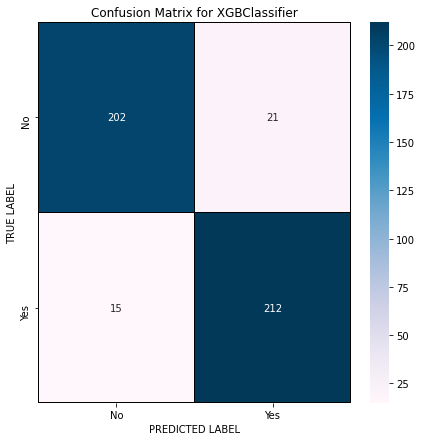

In [112]:
cm = confusion_matrix(y_test, predxg)

x_axis_labels = ["No","Yes"]
y_axis_labels = ["No","Yes"]

f, ax = plt.subplots(figsize =(7,7))
sns.heatmap(cm, annot = True, linewidths=0.2, linecolor="black", fmt = ".0f", ax=ax, cmap="PuBu", xticklabels=x_axis_labels, yticklabels=y_axis_labels)
plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for XGBClassifier')
plt.show()

We can see the true values and predicted values in XGB Classifier model using confusion matrix.

# iii) ExtraTreeClassifier:

In [113]:
ETC=ExtraTreesClassifier()
ETC.fit(X_train,y_train)
predet=ETC.predict(X_test)
print('Accuracy Score:',accuracy_score(y_test, predet))
print('Confusion Matrix:',confusion_matrix(y_test, predet))
print(classification_report(y_test,predet))

Accuracy Score: 0.9355555555555556
Confusion Matrix: [[204  19]
 [ 10 217]]
              precision    recall  f1-score   support

           0       0.95      0.91      0.93       223
           1       0.92      0.96      0.94       227

    accuracy                           0.94       450
   macro avg       0.94      0.94      0.94       450
weighted avg       0.94      0.94      0.94       450



ETC is giving me 93.5% accuracy.

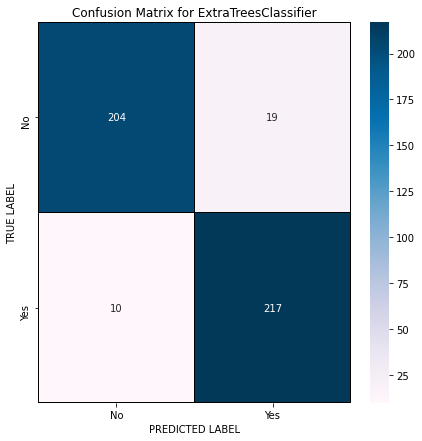

In [114]:
cm = confusion_matrix(y_test, predet)

x_axis_labels = ["No","Yes"]
y_axis_labels = ["No","Yes"]

f, ax = plt.subplots(figsize =(7,7))
sns.heatmap(cm, annot = True, linewidths=0.2, linecolor="black", fmt = ".0f", ax=ax, cmap="PuBu", xticklabels=x_axis_labels, yticklabels=y_axis_labels)
plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for ExtraTreesClassifier')
plt.show()

We can see the true values and predicted values in Extra Tree Classifier model using confusion matrix.

# iv) Gradient Boosting Classifier:

In [115]:
GBC=GradientBoostingClassifier()
GBC.fit(X_train,y_train)
predgb=GBC.predict(X_test)
print('Accuracy Score:',accuracy_score(y_test, predgb))
print('Confusion Matrix:',confusion_matrix(y_test, predgb))
print(classification_report(y_test,predgb))

Accuracy Score: 0.9111111111111111
Confusion Matrix: [[201  22]
 [ 18 209]]
              precision    recall  f1-score   support

           0       0.92      0.90      0.91       223
           1       0.90      0.92      0.91       227

    accuracy                           0.91       450
   macro avg       0.91      0.91      0.91       450
weighted avg       0.91      0.91      0.91       450



GBC is giving me 91.1% accuracy.

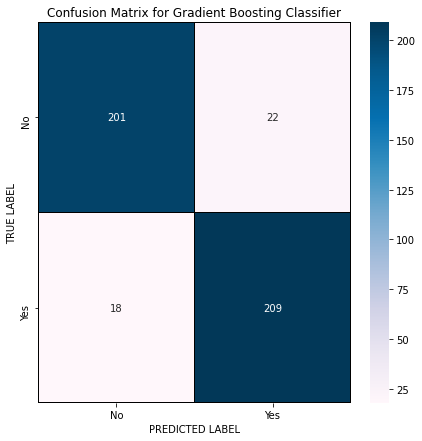

In [116]:
cm = confusion_matrix(y_test, predgb)

x_axis_labels = ["No","Yes"]
y_axis_labels = ["No","Yes"]

f, ax = plt.subplots(figsize =(7,7))
sns.heatmap(cm, annot = True, linewidths=0.2, linecolor="black", fmt = ".0f", ax=ax, cmap="PuBu", xticklabels=x_axis_labels, yticklabels=y_axis_labels)
plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for Gradient Boosting Classifier')
plt.show()

We can see the true values and predicted values in Gradient Boosting Classifier model using confusion matrix.

# v) SupportVectorClassifier:

In [117]:
SV=SVC()
SV.fit(X_train,y_train)
predsv=SV.predict(X_test)
print('Accuracy Score:',accuracy_score(y_test, predsv))
print('Confusion Matrix:',confusion_matrix(y_test, predsv))
print(classification_report(y_test,predsv))

Accuracy Score: 0.8844444444444445
Confusion Matrix: [[188  35]
 [ 17 210]]
              precision    recall  f1-score   support

           0       0.92      0.84      0.88       223
           1       0.86      0.93      0.89       227

    accuracy                           0.88       450
   macro avg       0.89      0.88      0.88       450
weighted avg       0.89      0.88      0.88       450



SVC is giving me 88.4% accuracy.

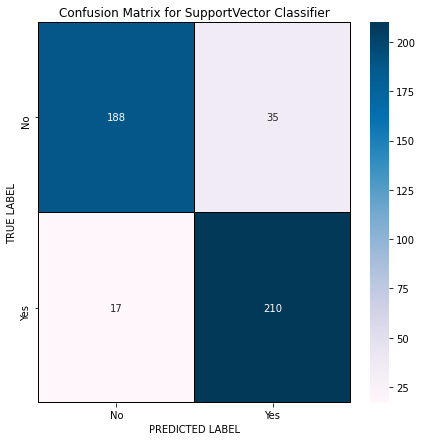

In [118]:
cm = confusion_matrix(y_test, predsv)

x_axis_labels = ["No","Yes"]
y_axis_labels = ["No","Yes"]

f, ax = plt.subplots(figsize =(7,7))
sns.heatmap(cm, annot = True, linewidths=0.2, linecolor="black", fmt = ".0f", ax=ax, cmap="PuBu", xticklabels=x_axis_labels, yticklabels=y_axis_labels)
plt.xlabel("PREDICTED LABEL")
plt.ylabel("TRUE LABEL")
plt.title('Confusion Matrix for SupportVector Classifier')
plt.show()

We can see the true values and predicted values in Support Vector Classifier Classifier model using confusion matrix.

# Cross validation scores:

In [119]:
#Importing library
from sklearn.model_selection import cross_val_score

In [120]:
# cv score for Random Forest Classifier
print(cross_val_score(RFC,X,y,cv=5).mean())

0.8633333333333333


In [121]:
# cv score for XGB Classifier
print(cross_val_score(XGB,X,y,cv=5).mean())

0.876


In [122]:
# cv score for Extra Trees Classifier
print(cross_val_score(ETC,X,y,cv=5).mean())

0.9099999999999999


In [123]:
# cv score for Gradient Boosting Classifier
print(cross_val_score(GBC,X,y,cv=5).mean())

0.8780000000000001


In [124]:
# cv score for Support vector Classifier
print(cross_val_score(SV,X,y,cv=5).mean())

0.8680000000000001


Above are the cross validation scores of RFC, XGB, ETC, GBC and SV.

By looking into the difference of model accuracy and cross validation score I found ExtraTreesClassifier as best model.

# ROC-AUC curve:

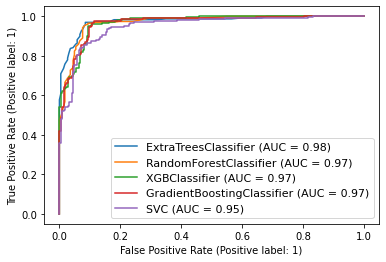

In [125]:
# Plotting for all the models used here
from sklearn import datasets 
from sklearn import metrics
from sklearn import model_selection
from sklearn.metrics import plot_roc_curve 
disp = plot_roc_curve(ETC,X_test,y_test)
plot_roc_curve(RFC, X_test, y_test, ax=disp.ax_)     # ax_=Axes with confusion matrix
plot_roc_curve(XGB, X_test, y_test, ax=disp.ax_)
plot_roc_curve(GBC, X_test, y_test, ax=disp.ax_)
plot_roc_curve(SV, X_test, y_test, ax=disp.ax_)

plt.legend(prop={'size':11}, loc='lower right')
plt.show()

Above is the ROC curves for all the models that i have predicted.And the AUC values can also be seen in the plot.

- AUC value is high for ExtraTreesClassifier and RandomForestClassifier.I got least difference in model accuracy and cross validation score for ExtreTreesClassifier so ETC is my best model.

# Hyper Parameter tuning:

In [126]:
#importing necessary libraries
from sklearn.model_selection import GridSearchCV

In [127]:
parameter = {'criterion':['gini','entropy'],
             'max_depth': [10,12,15,20,22],
             'n_estimators':[500,700,1000,1200],
             'max_features':['aoto','sqrt','log2'],
             'min_samples_split': [2]}

Giving the parameters list for ETC model.

In [128]:
GCV=GridSearchCV(ExtraTreesClassifier(),parameter,cv=5)

Running grid search CV for ETC.

In [129]:
GCV.fit(X_train,y_train)

GridSearchCV(cv=5, estimator=ExtraTreesClassifier(),
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [10, 12, 15, 20, 22],
                         'max_features': ['aoto', 'sqrt', 'log2'],
                         'min_samples_split': [2],
                         'n_estimators': [500, 700, 1000, 1200]})

Training the model with GCV.

In [130]:
GCV.best_params_

{'criterion': 'gini',
 'max_depth': 22,
 'max_features': 'log2',
 'min_samples_split': 2,
 'n_estimators': 1200}

Got the best parameters for ETC.

In [131]:
Fraud_mod=ExtraTreesClassifier(criterion='gini', max_depth=20,max_features='log2', min_samples_split=2, n_estimators=1000)
Fraud_mod.fit(X_train,y_train)
pred=Fraud_mod.predict(X_test)
acc=accuracy_score(y_test, pred)

print('Accuracy Score:',(accuracy_score(y_test,pred)*100))
print('Confusion matrix:',confusion_matrix(y_test,pred))
print(classification_report(y_test,pred))

Accuracy Score: 93.11111111111111
Confusion matrix: [[204  19]
 [ 12 215]]
              precision    recall  f1-score   support

           0       0.94      0.91      0.93       223
           1       0.92      0.95      0.93       227

    accuracy                           0.93       450
   macro avg       0.93      0.93      0.93       450
weighted avg       0.93      0.93      0.93       450



Before the model accuracy was 92.44% after tunning also it is the same 92.44% it looks good!!!!! No problem:)

# AUC ROC CURVE for final model:

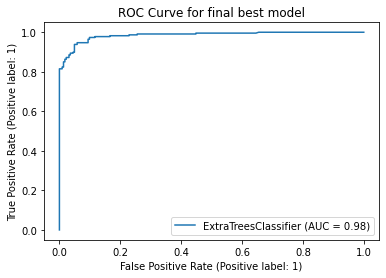

In [132]:
#Ploting ROC curve for final best model
plot_roc_curve(Fraud_mod, X_test, y_test)
plt.title('ROC Curve for final best model')
plt.show()

Great after hyperparameter tuning we got improvement in roc curve and AUC also.

# Saving the model:

In [133]:
#Saving the model as .pkl file
import joblib
joblib.dump(Fraud_mod,"InsuranceClaimFraud.pkl")

['InsuranceClaimFraud.pkl']

I have saved the final best model as CustomerChurn.Using .pkl.

# Predictions:

In [134]:
# Loading the saved model
model=joblib.load("InsuranceClaimFraud.pkl")

#Prediction
prediction = model.predict(X_test)
prediction

array([0, 1, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0,
       0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 1, 1, 0,
       0, 1, 1, 1, 0, 1, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 0,
       0, 0, 0, 0, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1,
       0, 1, 0, 1, 0, 1, 0, 1, 0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1,
       1, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 1, 1, 1, 0, 0,
       0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 1,
       0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 1, 0,
       1, 0, 0, 1, 0, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 0, 1, 1, 0, 0, 1, 1,
       1, 1, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1,
       0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 0, 1,
       1, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1,
       1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0,
       1, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 0, 1,

In [135]:
pd.DataFrame([model.predict(X_test)[:],y_test[:]],index=["Predicted","Actual"])

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449
Predicted,0,1,1,0,0,0,0,1,1,0,1,0,1,1,0,0,0,1,0,1,0,0,0,0,0,1,0,0,1,1,1,1,0,0,1,0,1,1,1,1,0,1,1,0,0,1,1,1,0,1,1,1,0,0,0,1,1,0,1,1,1,1,0,0,1,0,0,0,0,0,1,1,0,1,0,1,0,1,1,0,1,0,0,0,0,1,1,1,0,1,0,1,0,1,0,1,0,1,0,0,0,0,1,0,1,1,0,1,1,1,1,0,1,1,1,0,0,0,0,1,0,1,0,0,1,1,0,1,1,1,0,0,0,1,0,1,1,1,0,1,0,1,0,0,1,0,1,0,0,1,1,1,0,1,0,0,1,1,0,1,1,0,1,0,1,1,0,1,1,1,1,1,0,1,1,0,1,0,0,1,0,1,1,1,1,0,0,0,1,0,0,0,1,1,0,0,1,1,1,1,1,1,0,0,1,0,0,0,1,0,1,0,0,1,1,1,0,1,0,1,0,1,0,1,1,1,0,0,1,1,1,1,1,0,0,1,1,1,1,0,0,1,1,0,1,0,0,0,1,0,0,1,0,1,0,0,1,0,0,1,1,1,1,1,1,0,0,0,1,0,1,0,0,1,0,1,1,1,1,1,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,1,1,1,0,0,1,1,1,1,0,1,0,1,0,0,1,1,0,0,0,0,1,0,0,0,1,1,0,0,0,1,0,0,1,0,1,1,1,1,0,1,1,1,0,0,1,1,1,1,1,1,1,1,1,1,1,0,1,1,1,0,1,0,1,1,0,0,1,0,1,0,0,0,0,0,0,1,1,0,0,0,1,1,1,1,0,0,0,0,1,0,0,0,1,1,1,1,1,0,0,0,0,0,1,0,0,1,0,0,0,1,0,1,1,0,0,1,0,0,1,1,1,1,1,0,0,1,0,0,0,1,1,0,0,0,1,1,1,1,0,1,1,1,1,1,1,1,1,1,0
Actual,0,1,0,0,0,0,0,1,1,0,1,0,1,1,0,0,0,1,0,1,0,0,0,0,1,1,0,0,1,1,1,1,0,0,1,0,1,1,1,1,0,1,1,0,0,1,1,1,0,1,1,1,0,0,0,0,1,0,1,1,1,1,1,0,1,0,1,0,0,0,1,1,0,1,0,1,0,1,1,0,1,0,0,0,0,1,1,1,0,1,0,1,0,1,0,1,0,1,0,0,0,0,1,0,1,1,0,1,1,1,1,0,1,1,1,0,0,0,0,1,0,1,0,0,1,1,0,1,1,1,0,0,0,1,0,1,1,1,0,1,0,1,0,0,1,0,1,0,0,1,1,1,0,1,0,0,1,1,0,1,1,0,1,0,1,1,0,1,1,1,1,1,0,1,1,0,1,0,1,0,0,1,1,1,1,0,0,0,1,0,0,0,1,1,0,0,0,1,0,1,1,1,0,0,1,0,0,0,1,0,0,0,0,1,1,1,0,1,0,1,0,1,0,1,1,1,0,0,0,1,0,1,1,0,0,1,1,1,1,0,0,1,1,0,1,0,0,0,1,0,0,1,0,1,0,1,1,0,0,1,1,1,1,1,1,0,0,0,1,0,1,0,0,1,0,1,1,1,1,1,1,1,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,1,1,0,1,1,0,0,0,1,1,1,1,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,1,1,0,0,0,1,0,0,1,0,1,1,1,1,0,1,1,1,1,0,1,0,1,1,1,1,0,1,1,1,1,0,1,1,1,0,1,0,1,1,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,1,1,1,1,0,0,0,0,1,0,1,0,1,1,1,0,1,0,0,0,0,0,1,0,1,1,0,0,0,1,1,1,1,0,0,1,0,0,0,1,0,1,1,0,0,1,0,0,0,1,1,0,0,0,1,1,1,1,0,1,1,1,0,1,0,1,1,1,0


Above are the predicted values and the actual values.They are almost similar.

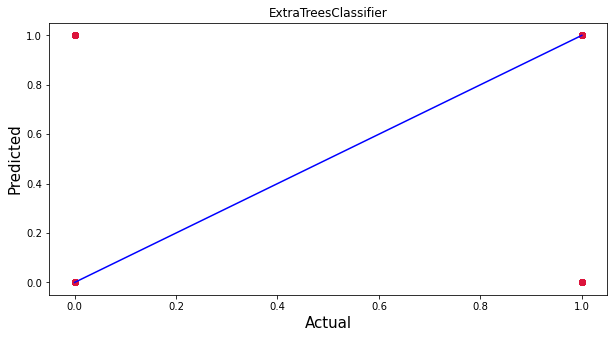

In [136]:
plt.figure(figsize=(10,5))
plt.scatter(y_test, prediction, c='crimson')
p1 = max(max(prediction), max(y_test))
p2 = min(min(prediction), min(y_test))
plt.plot([p1, p2], [p1, p2], 'b-')
plt.xlabel('Actual', fontsize=15)
plt.ylabel('Predicted', fontsize=15)
plt.title("ExtraTreesClassifier")
plt.show()

Plotting Actual vs Predicted,To get better insight.Bule line is the actual line and red dots are the predicted values.